In [4]:
from tqdm import tqdm
from torchvision import transforms
from torchsummary import summary
import os, cv2
import numpy as np
import pandas as pd
import random, tqdm
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

import warnings
warnings.filterwarnings("ignore")

import torch
import torch.nn as nn
from torch.utils.data import DataLoader
import torch.optim as optim
#import albumentations as album

In [ ]:
names[1]

# Modelo 1 - 2 classes

In [6]:
path_ori = r'C:\Users\kmorales\Desktop\2DO PhD\Strasbourg\Hugo_seg\originals_180919\originals'
path = r'C:\Users\kmorales\Desktop\2DO PhD\Strasbourg\Hugo_seg\ora_180919\Layers'
path_train_masks = os.path.join(path, 'train', 'mask')
path_train = os.path.join(path, 'train')

# names_ = [f[:-25] for f in os.listdir(path_train_masks) if  'calcif' in f]
# len(names)


names_ = [f[:-25] for f in os.listdir(path_train_masks) if f.endswith('png') and 'sheet' in f]
print(len(names_))
names_.sort()


mask_nod = [ f  for f in os.listdir(path_train_masks) if f.endswith('png') and 'nodular' in f and  f[:-27] in names_ ]
names  = [f[:-27] for f in mask_nod ]

mask_nod = [ os.path.join(path_train_masks, f)  for f in os.listdir(path_train_masks) if f.endswith('png') and 'nodular' in f and  f[:-27] in names_ ]
mask_sh = [os.path.join(path_train_masks, f) for f in os.listdir(path_train_masks) if f.endswith('png') and 'sheet' in f  and  f[:-25] in names ]

image_Paths  = [os.path.join(path_train_masks, f) for f in os.listdir(path_train_masks) if (f.endswith('grayscale.png') or f.endswith('greyscale.png') )  and f[:-14] in names]
print(len(mask_nod), len(mask_sh), len(image_Paths))

mask_bck = [os.path.join(path_train_masks, f) for f in os.listdir(path_train_masks) if f.endswith('png') and 'ale._nonbck' in f  and f[:-22] in names]
#mask_bck = [os.path.join(path_train_masks, f) for f in os.listdir(path_train_masks) if f.endswith('png') and 'nonbck' in f  and f[:-12] in names]
#mask_bck = [os.path.join(path_train_masks, f) for f in os.listdir(path_train_masks) if f.endswith('png') and 'nonbck' in f]

print(len(mask_nod), len(mask_sh), len(mask_bck), len(image_Paths))
mask_bck.sort()

mask_nod.sort()
mask_sh.sort()
image_Paths.sort()

mask_Paths  = [[nod, sh]  for nod, sh in zip(mask_nod,mask_sh) ]

#mask_Paths  = [[nod, sh, bck]  for nod, sh, bck in zip(mask_nod,mask_sh,mask_bck) ]



78
76 76 76
76 76 76 76


In [105]:
# path_test_masks = os.path.join(path, 'test', 'mask')
# path_test = os.path.join(path, 'test')

# names_ = [f[:-25] for f in os.listdir(path_test_masks) if f.endswith('png') and 'sheet' in f]
# print(len(names_))
# names_.sort()


# mask_nod = [ f  for f in os.listdir(path_test_masks) if f.endswith('png') and 'nodular' in f and  f[:-27] in names_ ]
# names  = [f[:-27] for f in mask_nod ]

# mask_nod = [ os.path.join(path_test_masks, f)  for f in os.listdir(path_test_masks) if f.endswith('png') and 'nodular' in f and  f[:-27] in names_ ]
# mask_sh = [os.path.join(path_test_masks, f) for f in os.listdir(path_test_masks) if f.endswith('png') and 'sheet' in f  and  f[:-25] in names ]
# #mask_bck = [os.path.join(path_test_masks, f) for f in os.listdir(path_test_masks) if f.endswith('png') and 'ale._nonbck' in f  and f[:-22] in names]
# mask_bck = [os.path.join(path_test_masks, f) for f in os.listdir(path_test_masks) if f.endswith('png') and 'nonbck' in f  and f[:-22] in names]

# image_Paths  = [os.path.join(path_test_masks, f) for f in os.listdir(path_test_masks) if (f.endswith('grayscale.png') or f.endswith('greyscale.png') )  and f[:-14] in names]
# print(len(mask_nod), len(mask_sh), len(mask_bck), len(image_Paths))
# mask_nod.sort()
# mask_sh.sort()
# mask_bck.sort()
# image_Paths.sort()



# mask_Paths  = [[nod, sh, bck]  for nod, sh, bck in zip(mask_nod,mask_sh,mask_bck) ]

In [10]:
def box_image_seg(seg_im, error = 5):
    label = (seg_im!=0)*1
    #label = (seg_im==2)*1 + (seg_im==3)*1
    pix  = np.sum(label)
    if pix > 12:
        contours , _ = cv2.findContours(label.astype(np.uint8), cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
        j = int(np.where([cv2.contourArea(x) for x in contours] == np.max([cv2.contourArea(x) for x in contours]))[0][0])
        x1, x2, y1, y2 = [], [], [], []
        for cntr in contours:
            x,y,w,h = cv2.boundingRect(cntr)
            x1.append(x)
            x2.append(x+w)    
            y1.append(y)
            y2.append(y+h)

        x, w = x1[j], x2[j]
        y, h  = y1[j] , y2[j]
    else:
        x  , y = 0 , 0
        h, w = seg_im.shape        
    return x,w, y , h

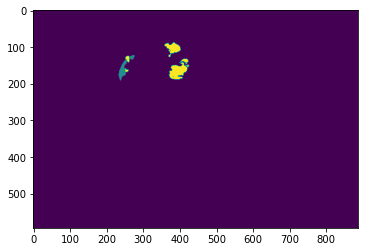

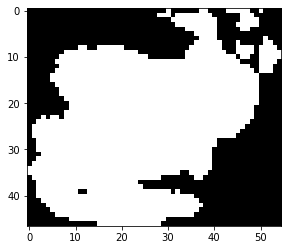

In [11]:
idx  = 20
mask =  create_binary_mask(mask_Paths, idx)
plt.imshow(mask)
plt.show()

x,w, y , h = box_image_seg(mask, error = 5)

plt.imshow(mask[y:h,x:w], cmap = 'bone')
plt.show()


In [108]:
# for idx in range(len(mask_Paths)):
#     mask =  create_binary_mask(mask_Paths, idx)
#     plt.imshow(mask)
#     plt.title('image' + str(idx))
#     plt.show()



(149, 115)


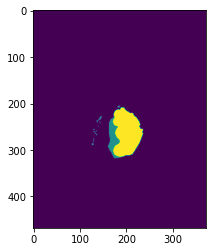

(98, 118)


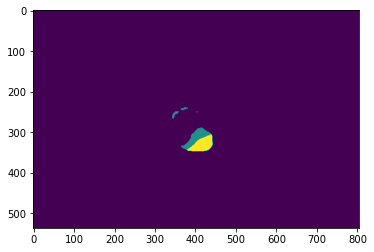

(94, 118)


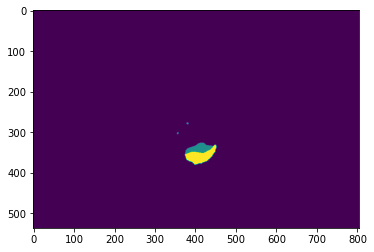

(148, 115)


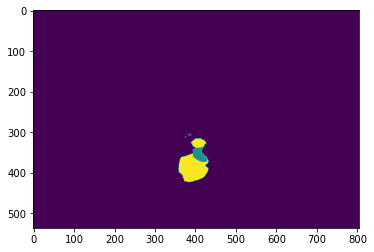

(114, 93)


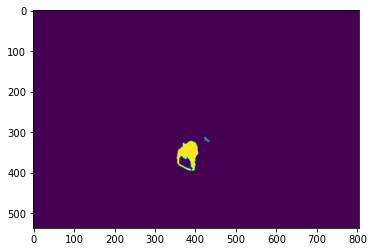

(173, 143)


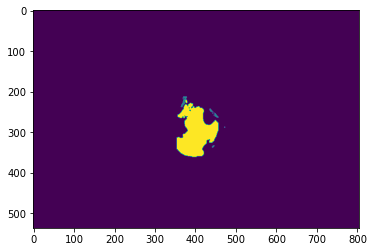

(178, 156)


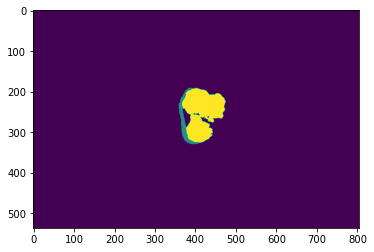

(98, 122)


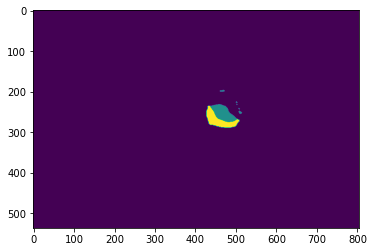

(83, 88)


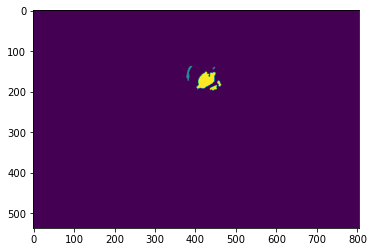

(90, 112)


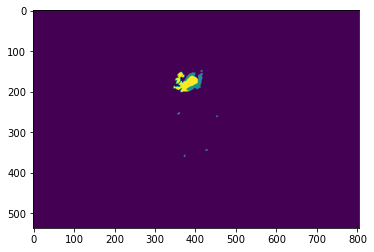

(77, 108)


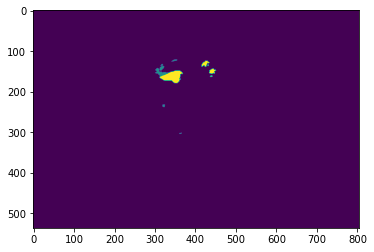

(71, 94)


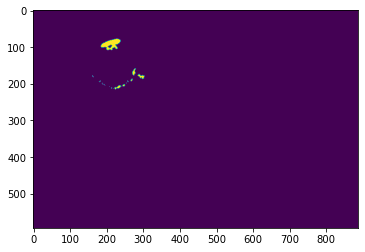

(50, 47)


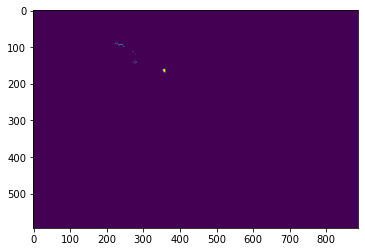

(202, 179)


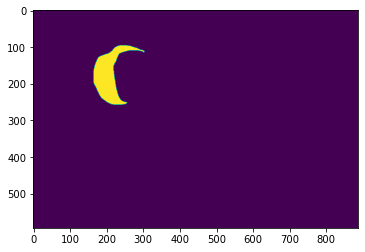

(96, 79)


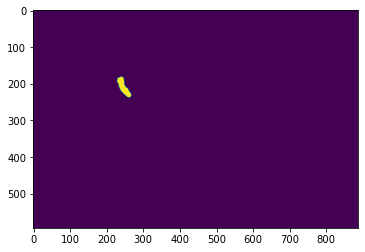

(54, 90)


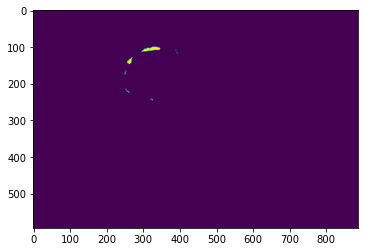

(100, 123)


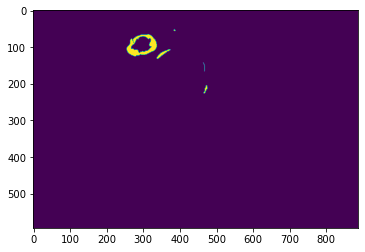

(133, 135)


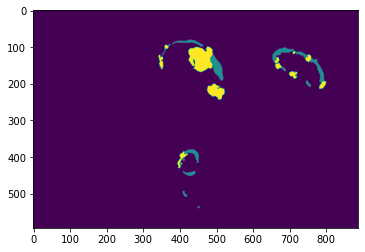

(189, 129)


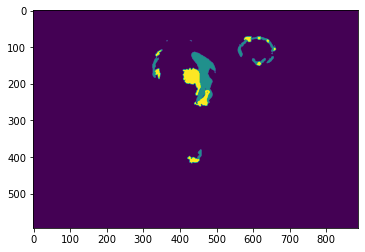

(238, 191)


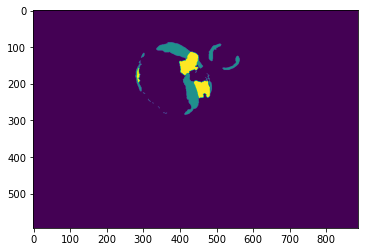

(87, 95)


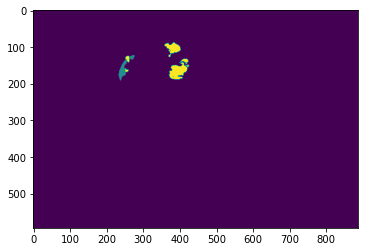

(97, 124)


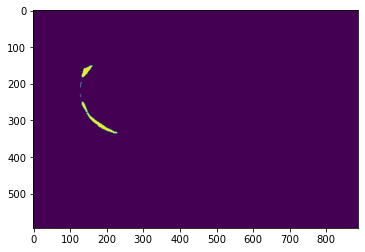

(86, 83)


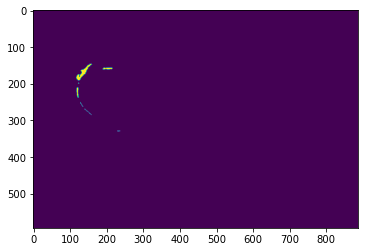

(165, 100)


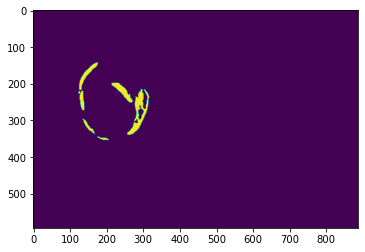

(143, 130)


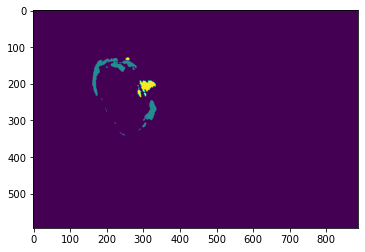

(59, 53)


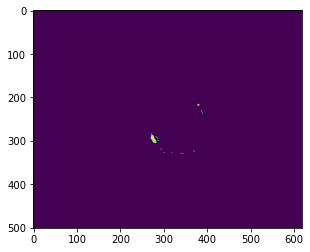

(101, 105)


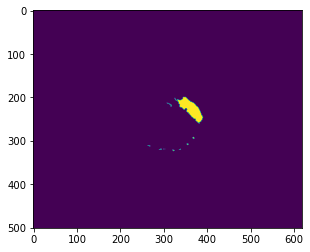

(123, 149)


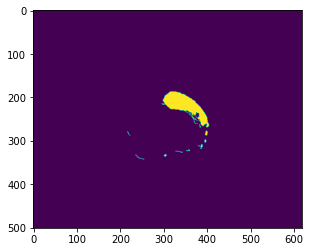

(128, 146)


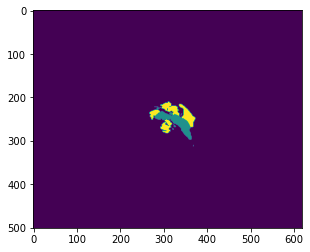

(88, 56)


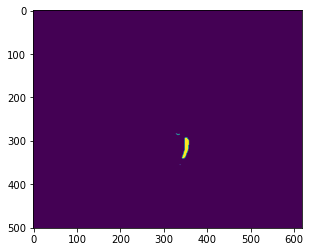

(177, 146)


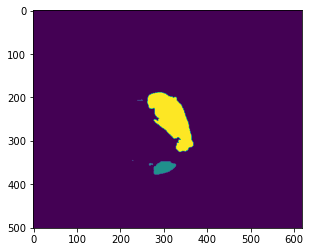

(145, 166)


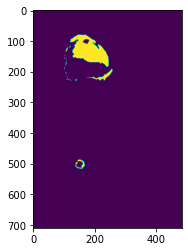

(114, 94)


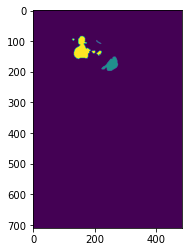

(185, 144)


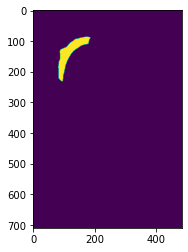

(224, 188)


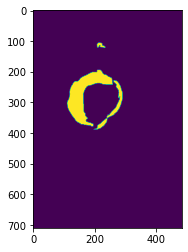

(49, 47)


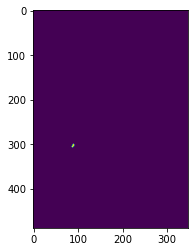

(104, 115)


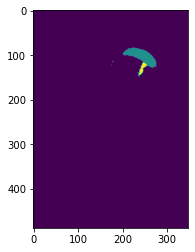

(93, 143)


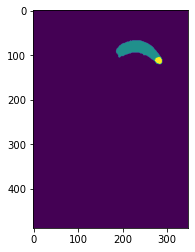

(45, 56)


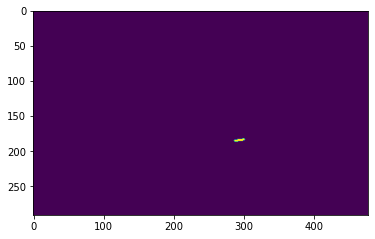

(50, 51)


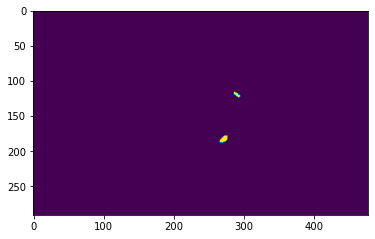

(84, 59)


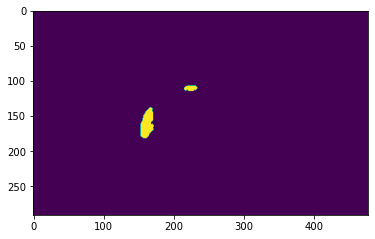

(76, 84)


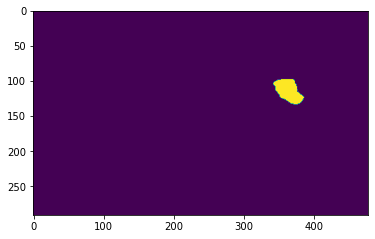

(66, 91)


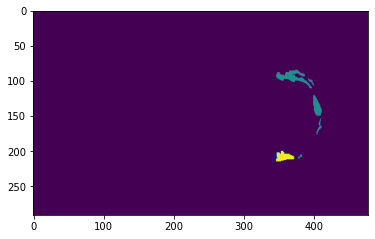

(67, 100)


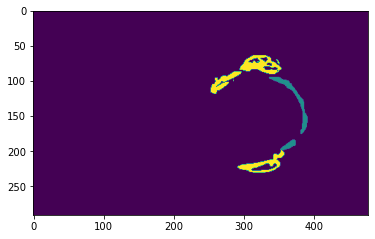

(172, 95)


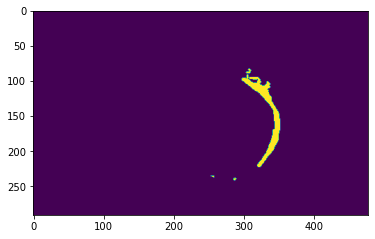

(53, 51)


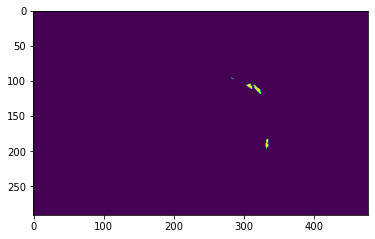

(111, 90)


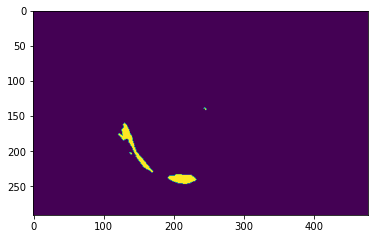

(118, 124)


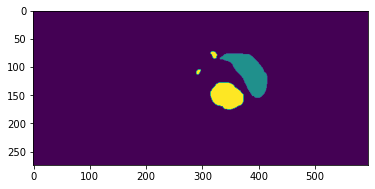

(66, 100)


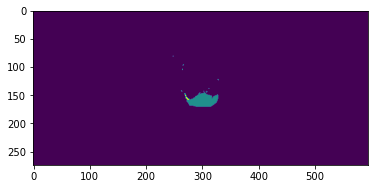

(97, 106)


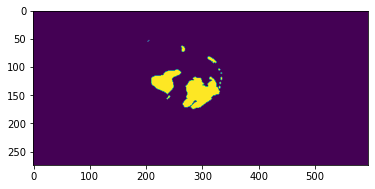

(97, 136)


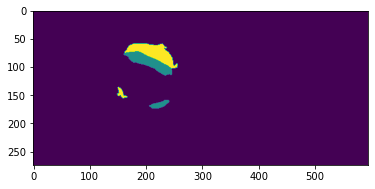

(114, 135)


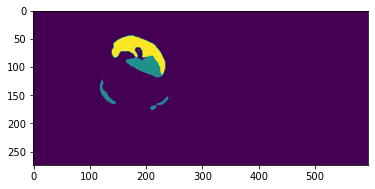

(84, 147)


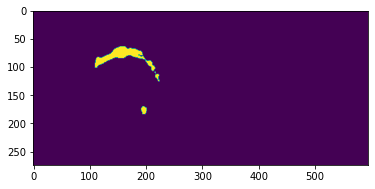

(73, 76)


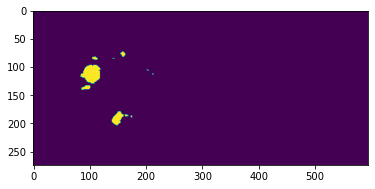

(160, 143)


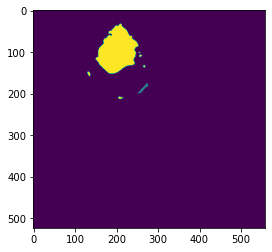

(121, 175)


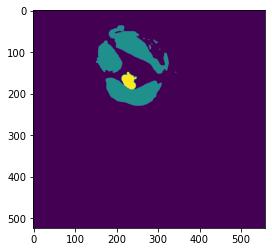

(171, 206)


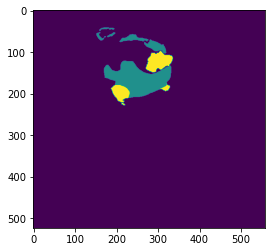

(124, 127)


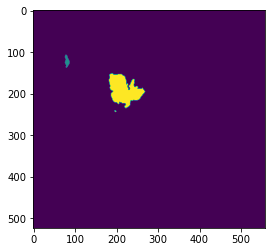

(204, 195)


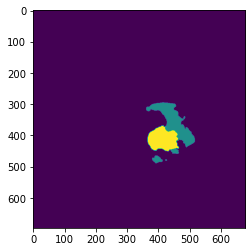

(115, 94)


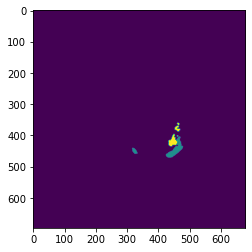

(102, 129)


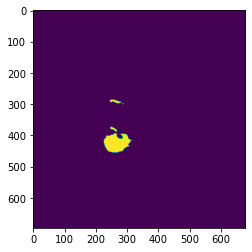

In [12]:
error = 20
idxs = []
for idx in range(len(mask_Paths)):
    mask =  create_binary_mask(mask_Paths, idx)
    image = read_image(image_Paths[idx], False )
    x,w, y , h = box_image_seg(mask)
    #print('\n Img: ', idx, x,w, y , h)
    if (h,w) != mask.shape:
        idxs.append(idx)
        print(mask[y-error:h+error,x-error:w+error].shape)
        plt.imshow(mask)
        plt.show()
        
#         plt.imshow(image[y-error:h+error,x-error:w+error])
#         plt.show()
#         plt.imshow(mask[y-error:h+error,x-error:w+error])
#         plt.title('image' + str(idx))
#         plt.show()
        


(149, 115)


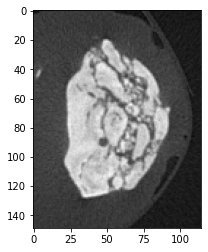

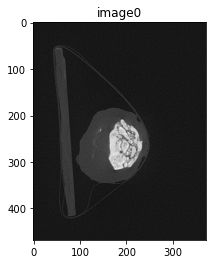

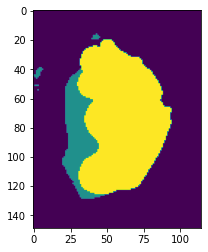

(98, 118)


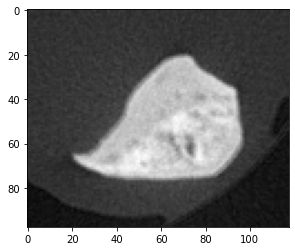

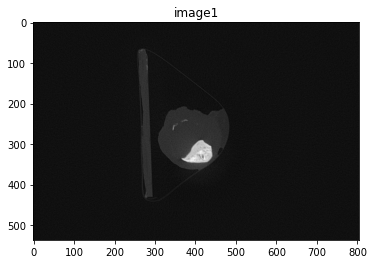

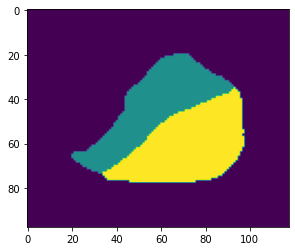

(94, 118)


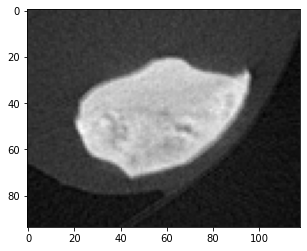

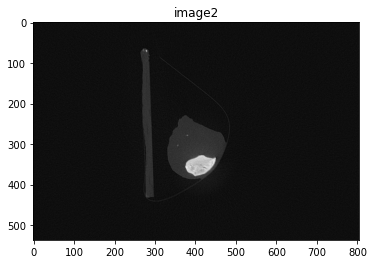

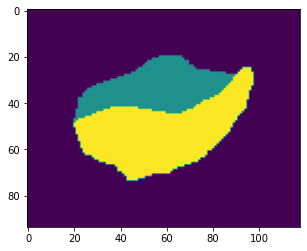

(148, 115)


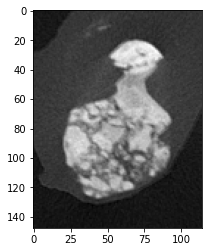

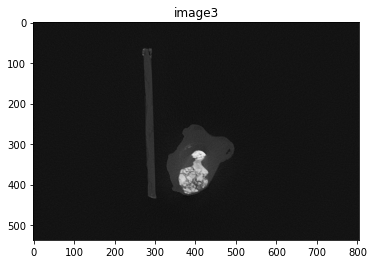

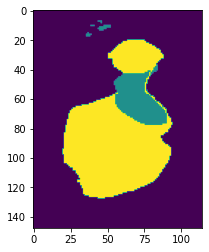

(114, 93)


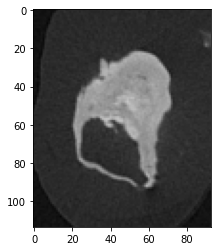

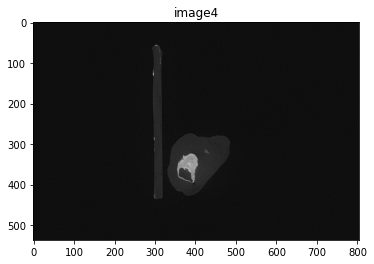

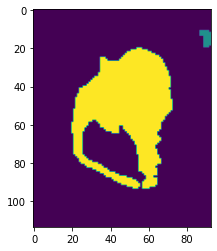

(173, 143)


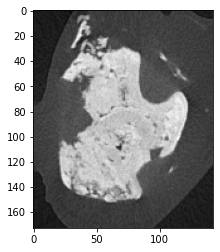

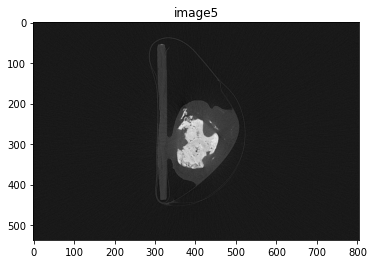

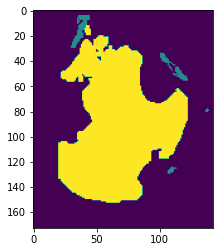

(178, 156)


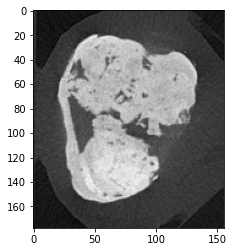

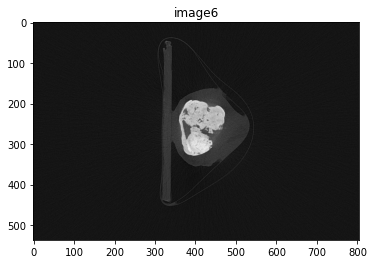

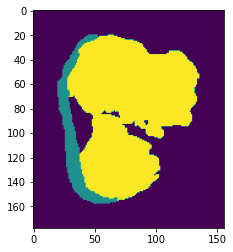

(98, 122)


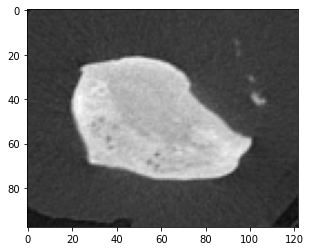

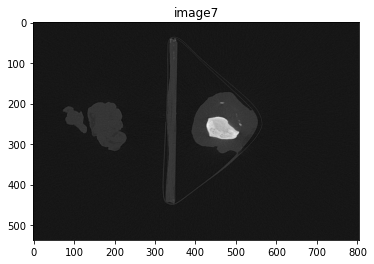

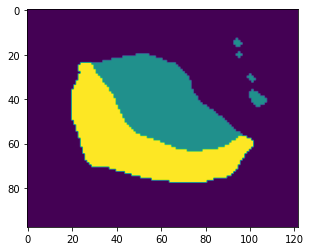

(83, 88)


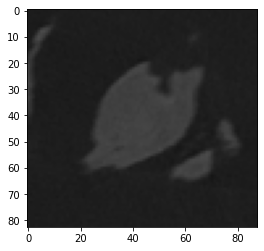

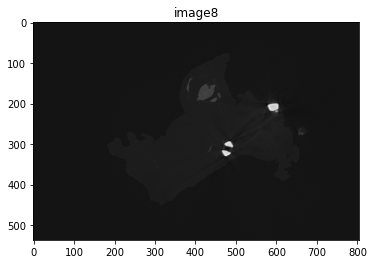

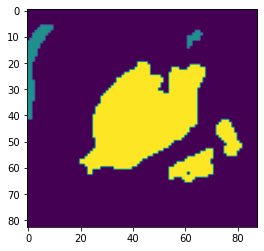

(90, 112)


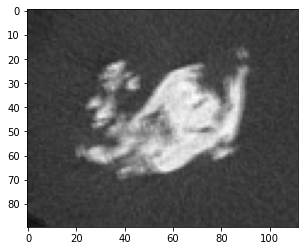

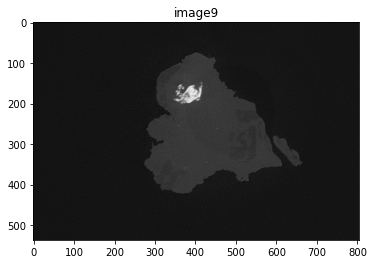

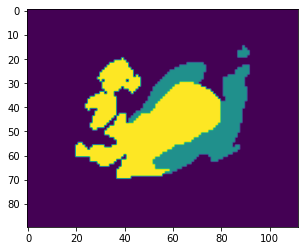

(77, 108)


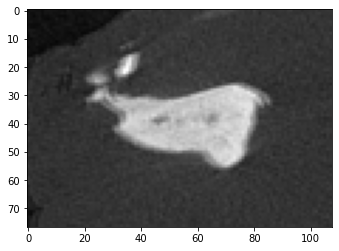

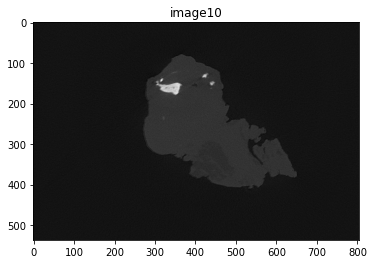

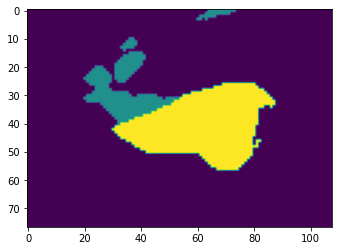

(71, 94)


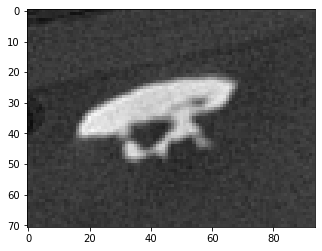

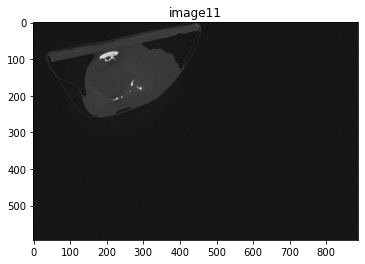

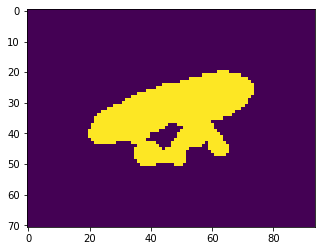

(50, 47)


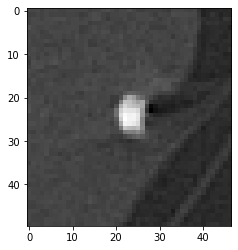

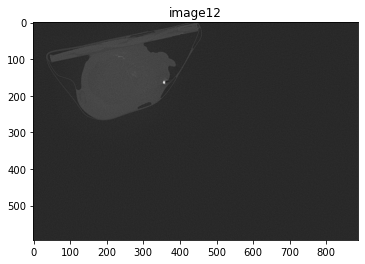

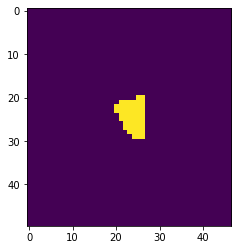

(202, 179)


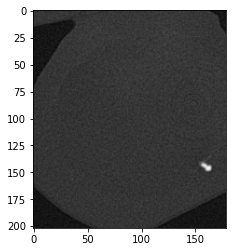

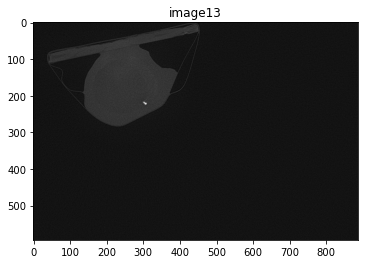

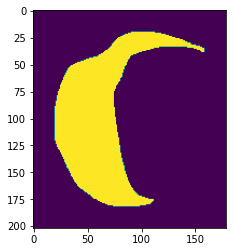

(96, 79)


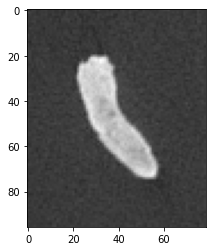

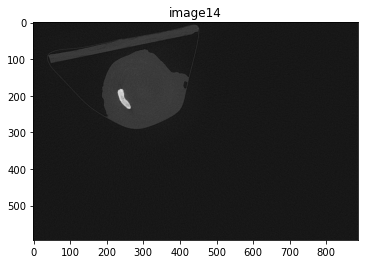

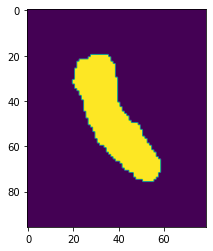

(54, 90)


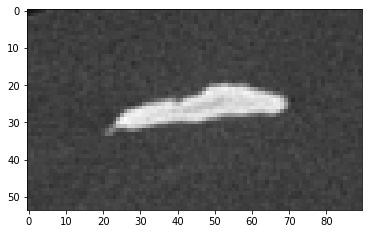

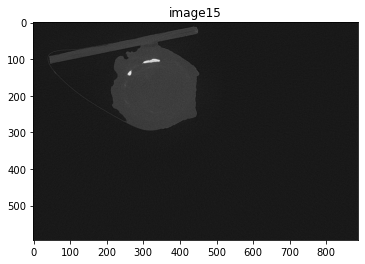

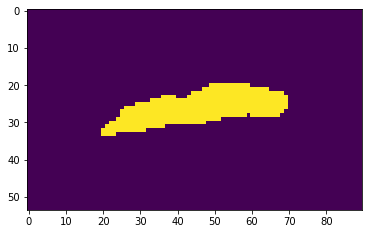

(100, 123)


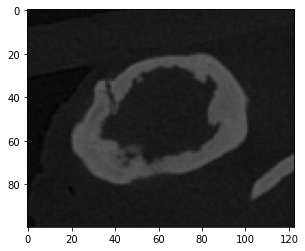

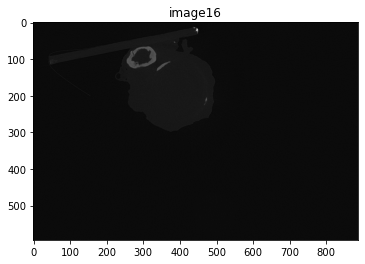

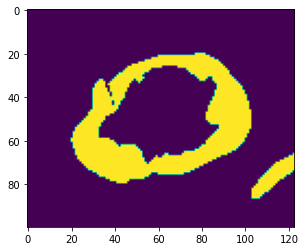

(133, 135)


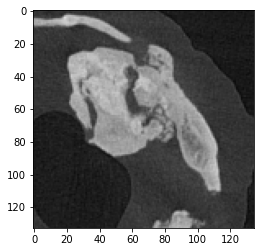

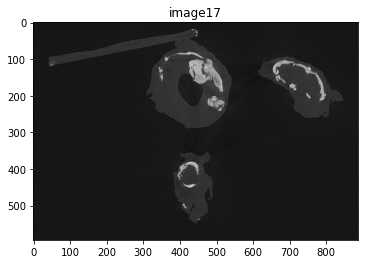

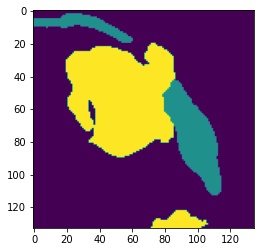

(189, 129)


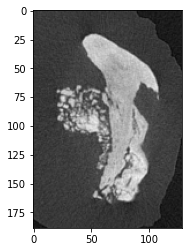

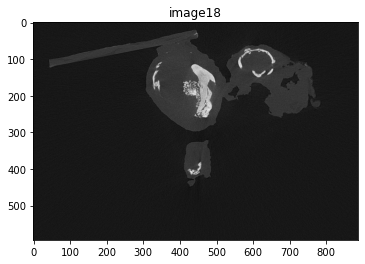

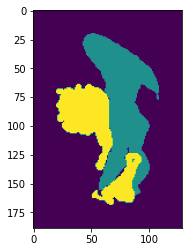

(238, 191)


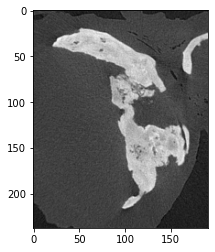

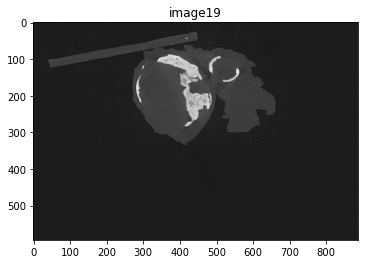

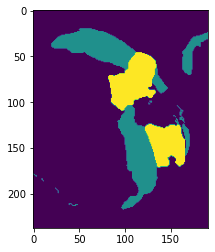

(87, 95)


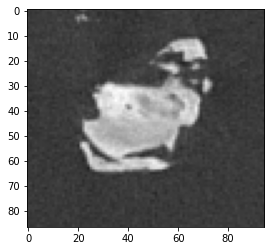

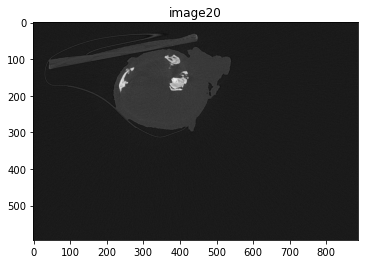

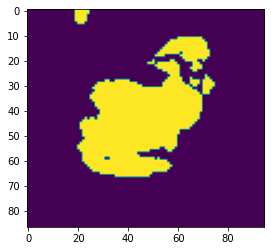

(97, 124)


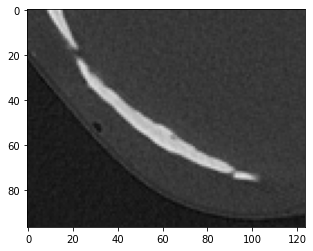

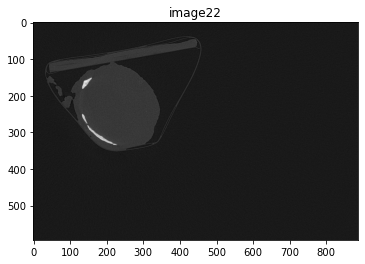

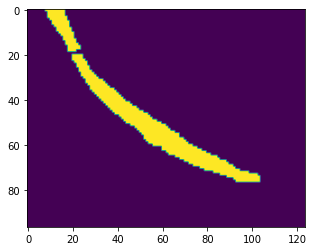

(86, 83)


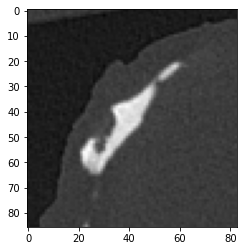

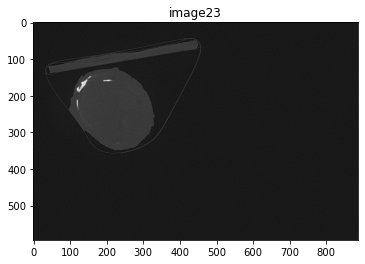

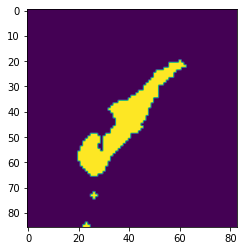

(165, 100)


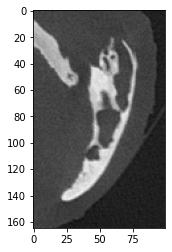

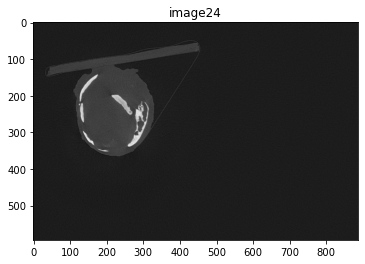

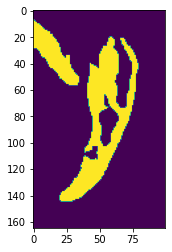

(143, 130)


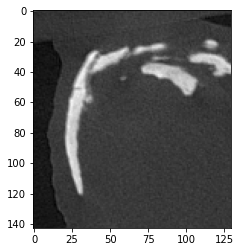

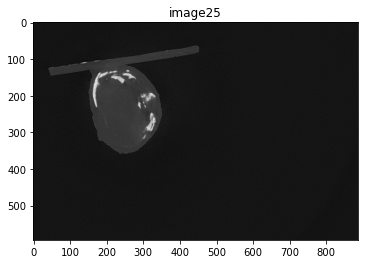

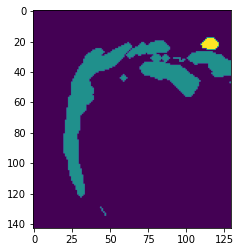

(59, 53)


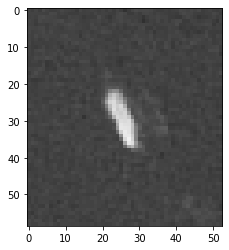

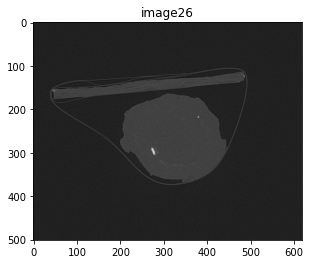

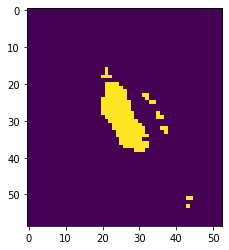

(101, 105)


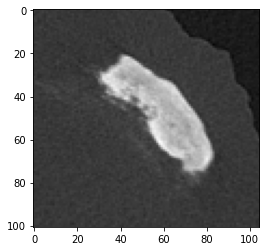

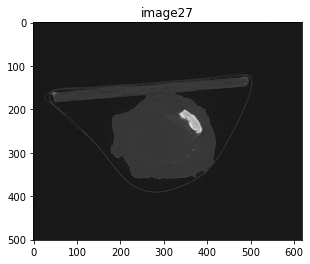

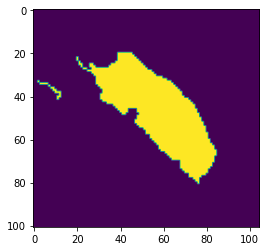

(123, 149)


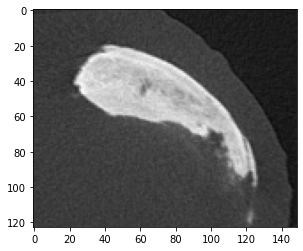

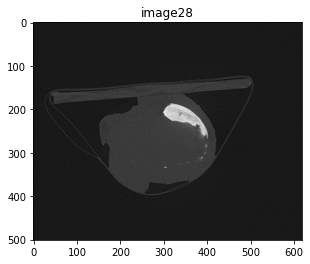

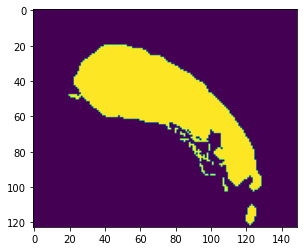

(128, 146)


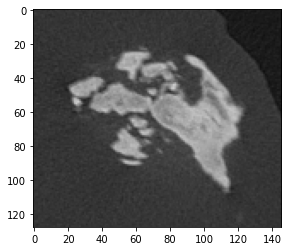

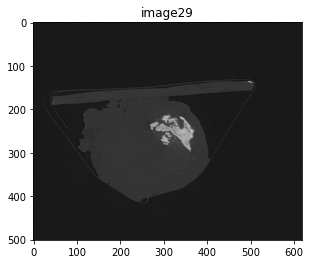

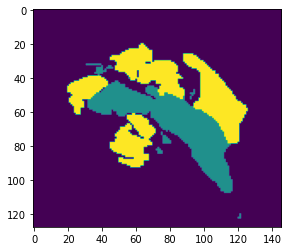

(88, 56)


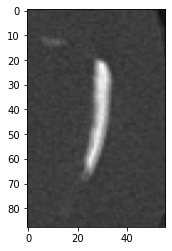

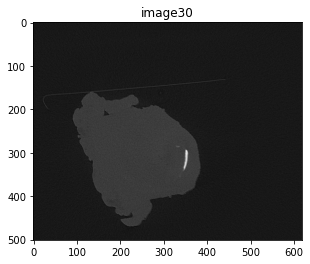

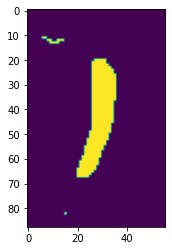

(177, 146)


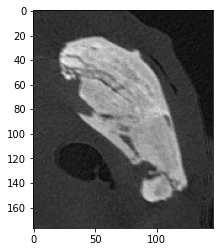

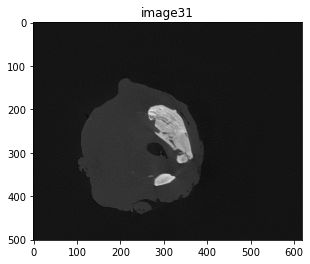

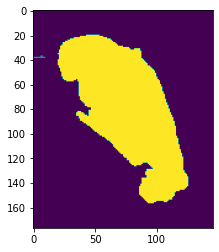

(145, 166)


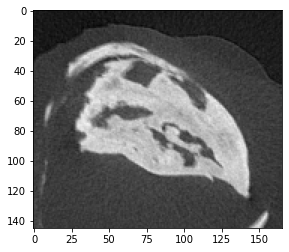

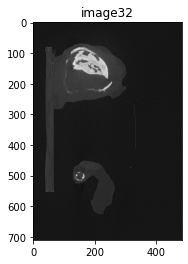

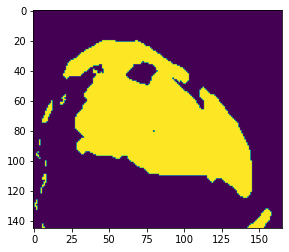

(114, 94)


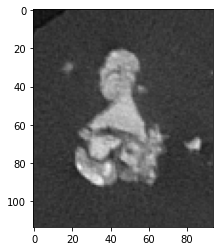

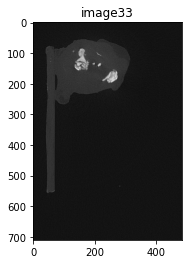

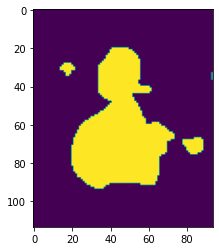

(185, 144)


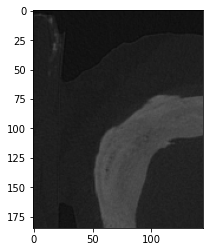

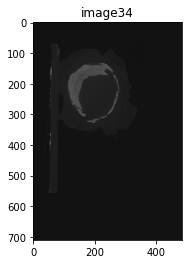

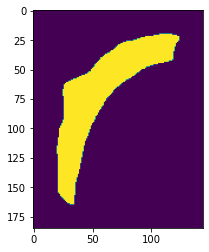

(224, 188)


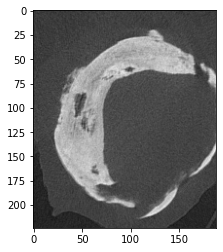

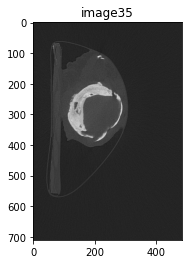

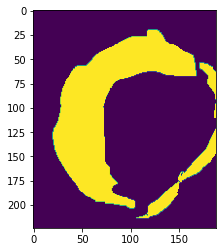

(49, 47)


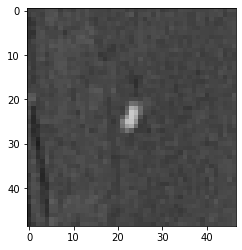

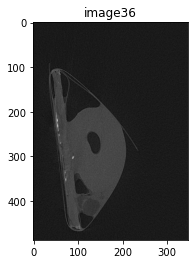

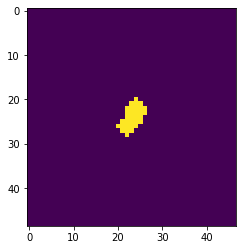

(104, 115)


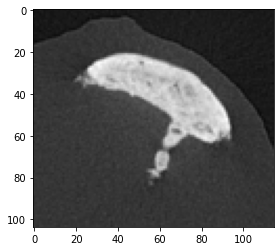

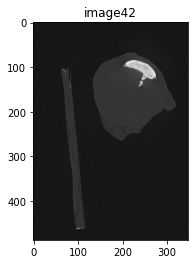

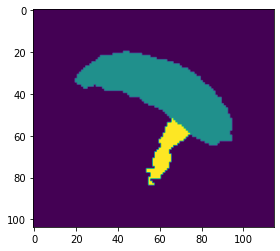

(93, 143)


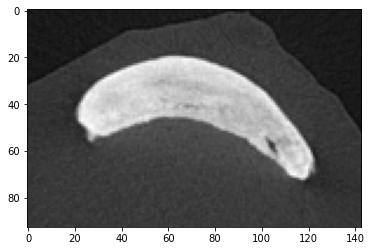

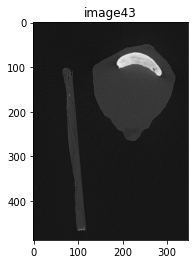

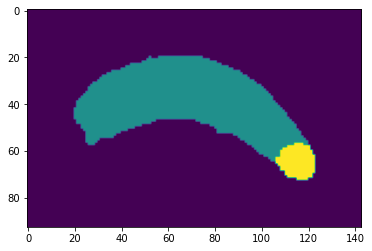

(45, 56)


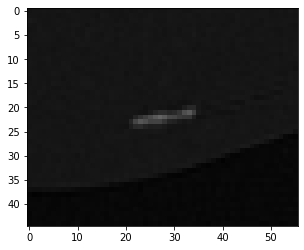

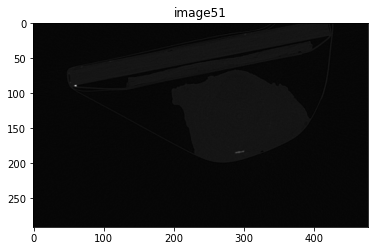

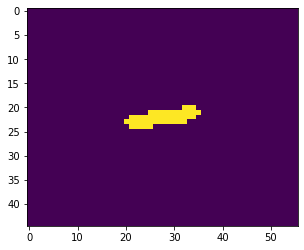

(50, 51)


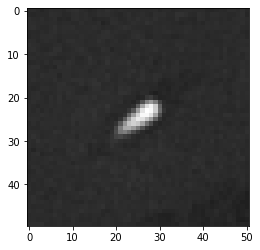

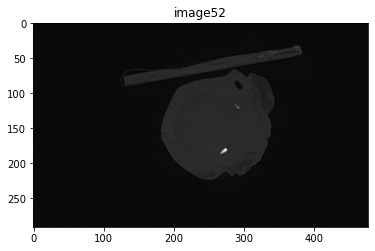

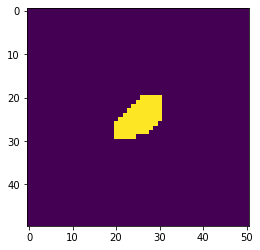

(84, 59)


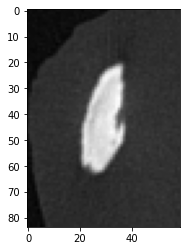

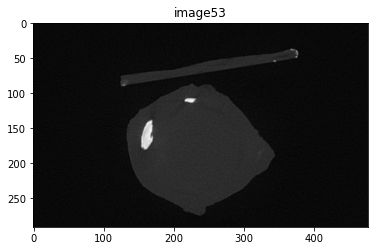

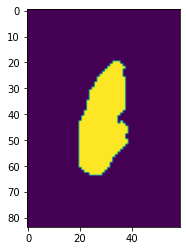

(76, 84)


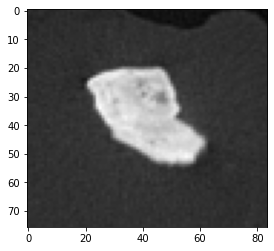

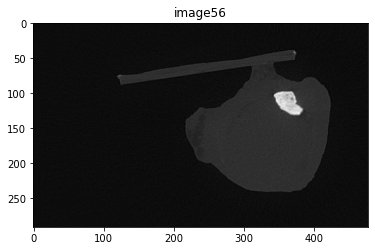

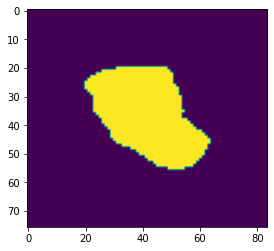

(66, 91)


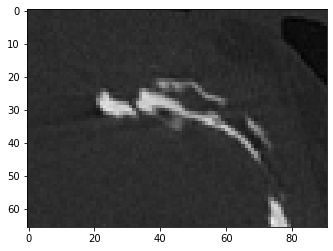

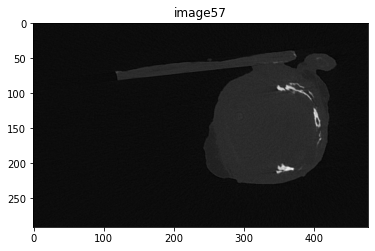

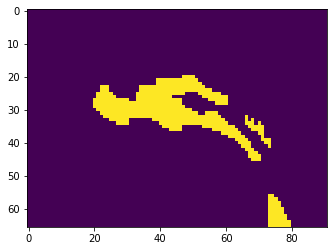

(67, 100)


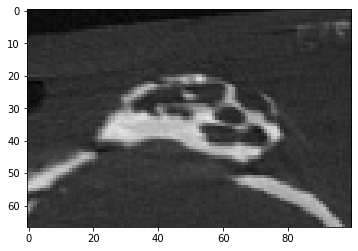

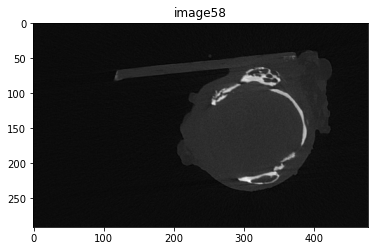

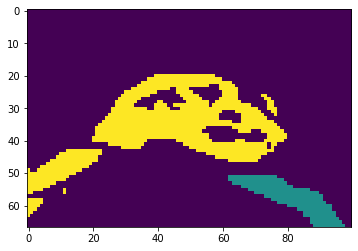

(172, 95)


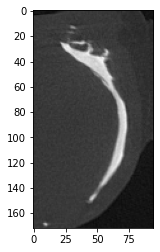

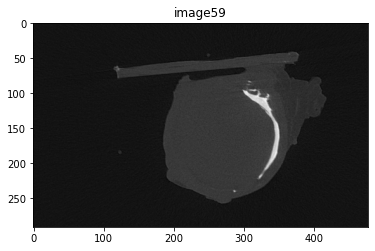

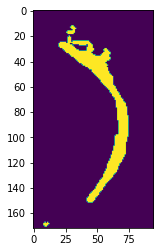

(53, 51)


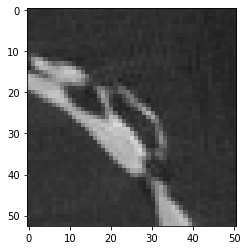

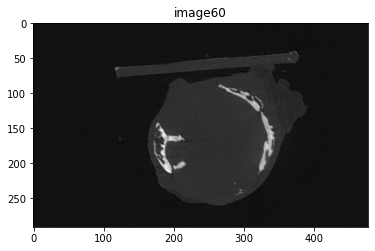

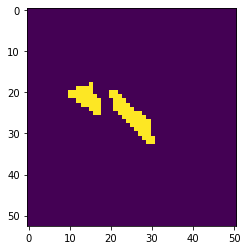

(111, 90)


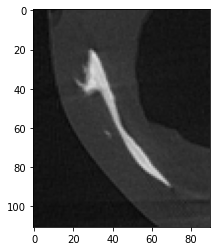

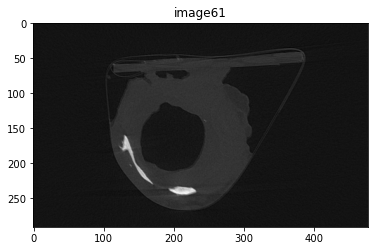

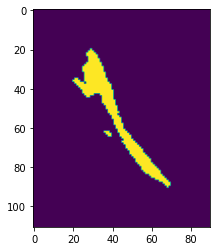

(118, 124)


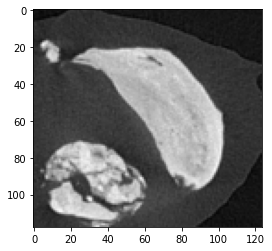

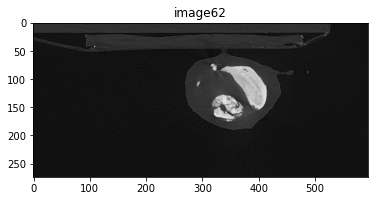

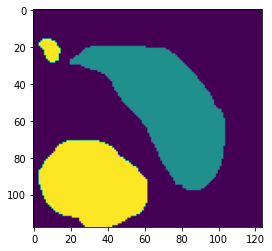

(66, 100)


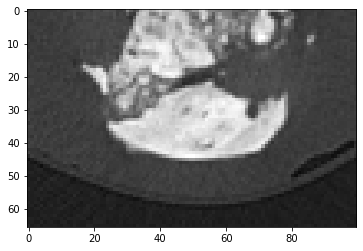

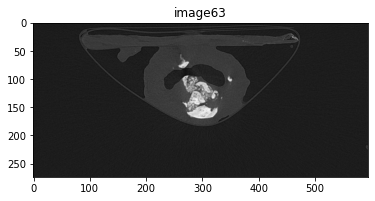

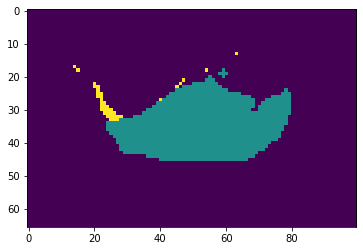

(97, 106)


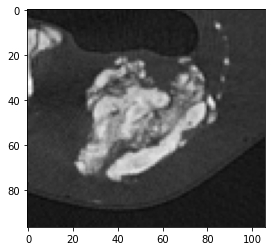

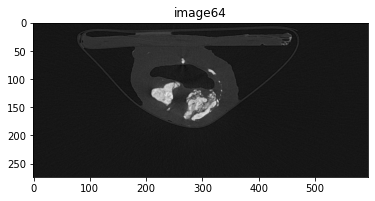

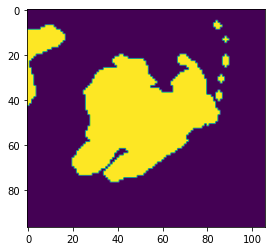

(97, 136)


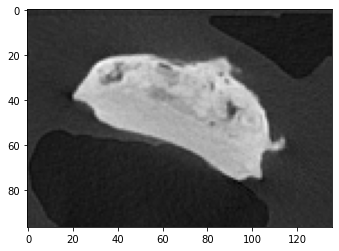

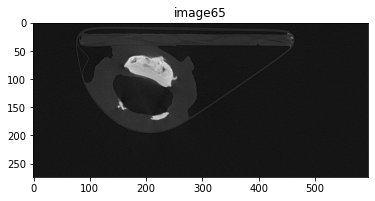

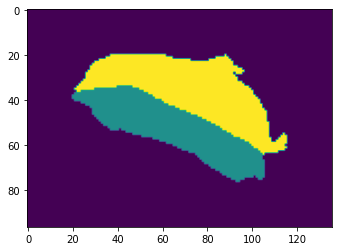

(114, 135)


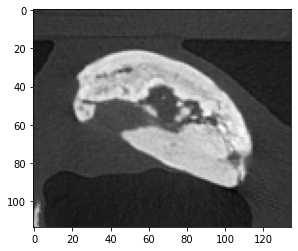

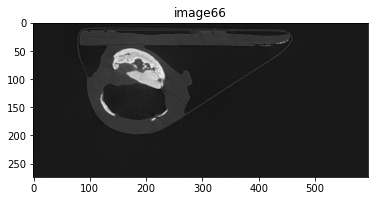

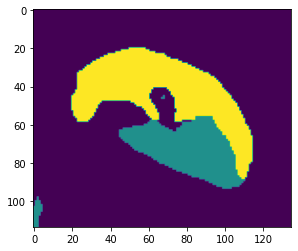

(84, 147)


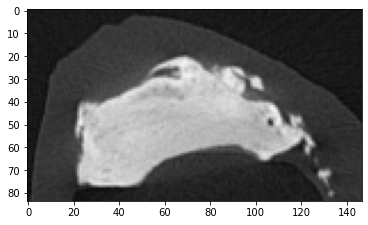

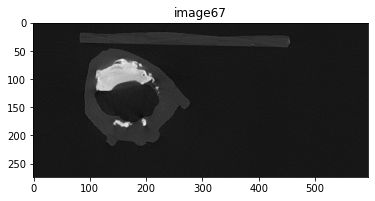

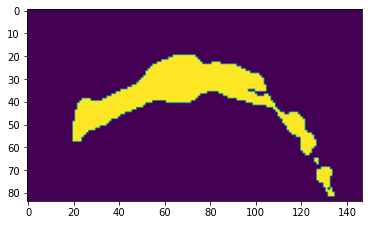

(73, 76)


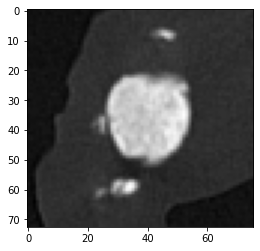

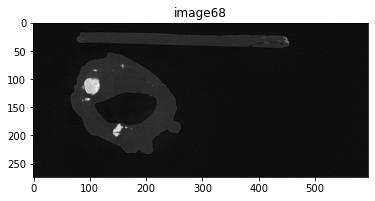

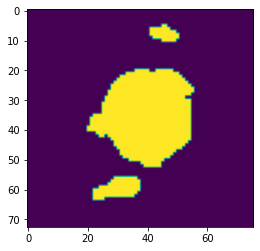

(160, 143)


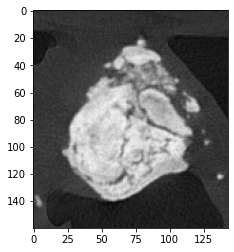

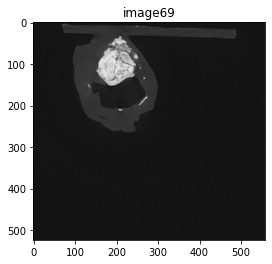

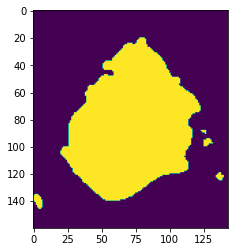

(121, 175)


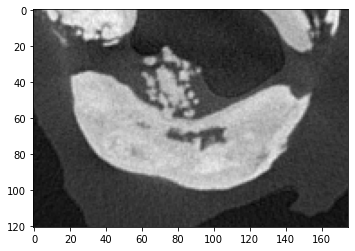

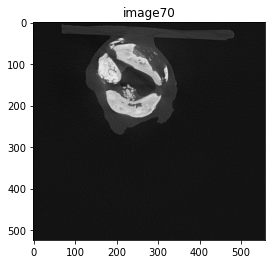

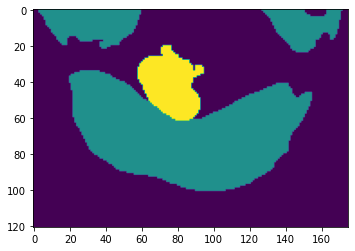

(171, 206)


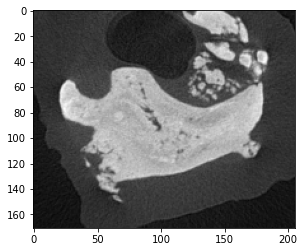

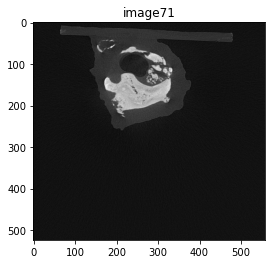

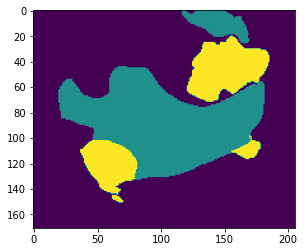

(124, 127)


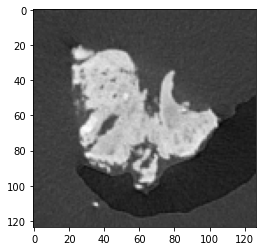

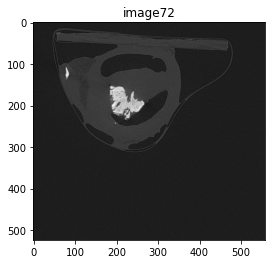

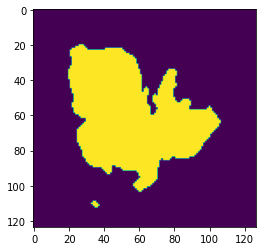

(204, 195)


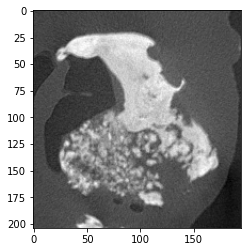

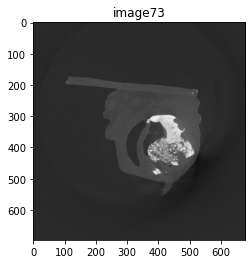

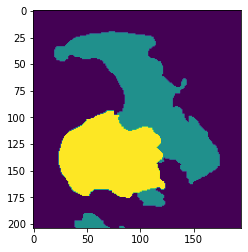

(115, 94)


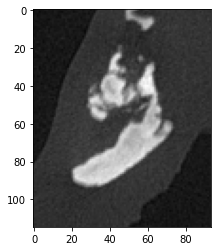

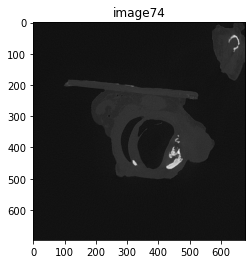

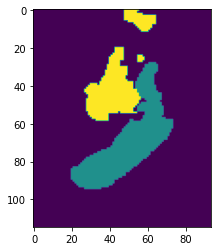

(102, 129)


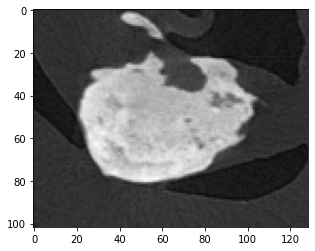

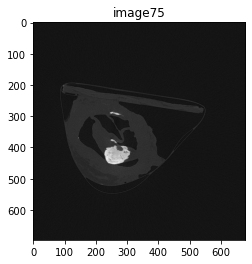

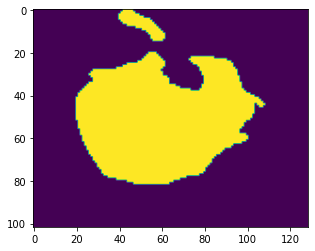

In [207]:
error = 20
idxs = []
for idx in range(len(mask_Paths)):
    mask =  create_binary_mask(mask_Paths, idx)
    image = read_image(image_Paths[idx], False )
    x,w, y , h = box_image_seg(mask)
    #print('\n Img: ', idx, x,w, y , h)
    if (h,w) != mask.shape:
        idxs.append(idx)
        print(mask[y-error:h+error,x-error:w+error].shape)
        plt.imshow(image[y-error:h+error,x-error:w+error])
        plt.show()
        plt.imshow(image)
        plt.title('image' + str(idx))
        plt.show()
        plt.imshow(mask[y-error:h+error,x-error:w+error])
        plt.show()
        
        


In [13]:
from torch.utils.data import Dataset
import cv2
import torchvision.transforms as transforms

H = W = 512


    
# def create_mask_box(image, mask, H, W):
#     new_image = image.copy()
#     new_mask = mask.copy()
#     x, w, y , h =  box_image_seg(mask, error = 5)  
    
#     print(x, w, y , h)
#     if not any(values<=0  for values in [x, w, y , h]):
#         if w - x >= W and h - y >= H:        
#             new_mask = mask[y:h, x:w]
#             new_image = Img[y:h, x:w, :]
#         else:
#             y_ =  (128 - (h-y))//2 + 2
#             x_ =  (128 - (w-x))//2 + 2
            
#             new_mask = mask[y:h, x:w]
#             new_image = Img[y:h, x:w, :]            
#     return new_image, new_mask 


def read_image(imagePath, mask = True ):
    if mask:
        image = cv2.imread(imagePath, 0)
        image = cv2.normalize(image.astype(np.int16),  None, 0, 255, cv2.NORM_MINMAX)
        image = np.where(image == 255, 1, 0)
        #(thresh, image) = cv2.threshold(image, 127, 255, cv2.THRESH_BINARY)
    else: 
        image = cv2.imread(imagePath)    
        image = cv2.normalize(image.astype(np.int16),  None, 0, 255, cv2.NORM_MINMAX)
        image = cv2.cvtColor( np.float32(image[:,:,1]),cv2.COLOR_GRAY2RGB)/255
        
    return image

def create_mask(mask_Path, idx):
    mask_img_bi = create_binary_mask(mask_Path, idx)
    n, m  =  mask_img_bi.shape
    mask_img = np.zeros(shape=(n, m, 3))
    for i in range(3):
        mask_img[0,0, :] = 1
        mask_img[:,:, i] = (i+1)*np.where(mask_img_bi == i+1, 1, 0)
        #mask_img[ :,:, i ]  = (i+1)*(Mask[:,:,i] == 255)
        #mask_img[ image == 255 ]  = (i+1)
    return mask_img 

def create_binary_mask(mask_Path, idx):
    list_images = create_img_mask(mask_Path, idx)
    list_images.reverse()
    
    n, m = list_images[0].shape
    mask_img = np.zeros((n,m),np.int64) 
    for i, image in enumerate(list_images):
        mask_img[ image == 1 ]  = (i+1)
    return mask_img    
    

def create_img_mask(mask_Path, idx):
    list_images = []
    for imagePath in mask_Path[idx]:
        list_images.append(read_image(imagePath))
    return list_images
 
import time
def train(model, dataloader, loss_fn, optimizer, acc_fn, epochs=1):
    start = time.time()
    model.to(device)

    train_loss = []

    best_acc = 0.0

    for epoch in range(epochs):
        print('Epoch {}/{}'.format(epoch, epochs - 1))
        print('-' * 10)

        model.train(True)  # Set trainind mode = true        
        
        running_loss = 0.0
        running_acc = 0.0

        step = 0

        # iterate over data
        for x, y in dataloader:
            x = x.to(device)
            y = y.to(device)
            step += 1
            
            optimizer.zero_grad()
            outputs = model(x)
            loss = loss_fn(outputs, y)

            # the backward pass frees the graph memory, so there is no 
            # need for torch.no_grad in this training pass
            loss.backward()
            optimizer.step()
            # scheduler.step()


            # stats - whatever is the phase
            acc = acc_fn(outputs, y)

            running_acc  += acc*dataloader.batch_size
            running_loss += loss*dataloader.batch_size 

            if step % 10 == 0:
                # clear_output(wait=True)
                print('Current step: {}  Loss: {}  '.format(step, loss))
                print('Current step: {}  Loss: {}  Acc: {} '.format(step, loss, acc))

                # print(torch.cuda.memory_summary())

        epoch_loss = running_loss / len(dataloader.dataset)
        epoch_acc = running_acc / len(dataloader.dataset)

        print('Loss: {:.4f} Acc: {}'.format(epoch_loss, epoch_acc))
        #print('Loss: {:.4f}'.format(epoch_loss))


        train_loss.append(epoch_loss)
        if epoch % 5 == 0: #Save model weight once every 60k steps permenant file
            print("Saving Model" +str(epoch) + ".torch")
            torch.save(model.state_dict(),   str(epoch) + ".torch")
        

    time_elapsed = time.time() - start
    print('Training complete in {:.0f}m {:.0f}s'.format(time_elapsed // 60, time_elapsed % 60))    
    
    return train_loss   

def acc_metric(predb, yb):
    return (predb.argmax(dim=1) == yb.to(device)).float().mean()



In [14]:
class SegmentationDataset(Dataset):
    def __init__(self, imagePaths, maskPaths, transforms = None, error = 20):
        # store the image and mask filepaths, and augmentation
        # transforms
        self.imagePaths = imagePaths
        self.maskPaths = maskPaths
        self.transforms = transforms
        self.error  =  error
    def __len__(self):
        return len(self.imagePaths)
    
    def __getitem__(self, idx):
        # grab the image path from the current index
        imagePath = self.imagePaths[idx]
        # load the image from disk, swap its channels from BGR to RGB,
        # and read the associated mask from disk in grayscale mode
        
        mask = create_binary_mask(self.maskPaths, idx)
        #mask = create_mask(self.maskPaths, idx)  
        image = read_image(imagePath, False )
        
        
        x,w, y , h = box_image_seg(mask)
#         mask = mask[y-error:h+error,x-error:w+error]
#         image = image[y-error:h+error,x-error:w+error]
        
        image = cv2.resize(image, (H, W), interpolation=cv2.INTER_NEAREST)
        mask = cv2.resize(mask, (H, W), interpolation=cv2.INTER_NEAREST)
        
        #image = torch.tensor(image, dtype=torch.float32).unsqueeze(dim=-1).permute(2,0,1)
        image = torch.tensor(image, dtype=torch.float32).permute(2,0,1)
        mask = torch.tensor(mask, dtype=torch.long) 
        #mask = torch.tensor(mask, dtype=torch.float32).permute(2, 0, 1) 
        
        #mask = torch.tensor(mask, dtype=torch.uint8).permute(2, 0, 1) 
        #mask = mask[:, :, None].permute(2, 0, 1)

        
        # check to see if we are applying any transformations
        if self.transforms is not None:
            # apply the transformations to both image and its mask
            image = self.transforms[0](image)
            mask = self.transforms[1](mask)
        # return a tuple of the image and its mask
        
        return image, mask

In [15]:
mask_Paths_ = [mask_Paths[idx] for idx in idxs]
image_Paths_ = [image_Paths[idx] for idx in idxs]
print(len(mask_Paths_), len(image_Paths_))

61 61


In [16]:
#data = SegmentationDataset(image_Paths, mask_Paths, [transformImg,transformAnn])
data = SegmentationDataset(image_Paths_, mask_Paths_)

dataloaders = torch.utils.data.DataLoader(data, 2)
#data = tqdm(data_loaded)
device = 'cpu'
for index, batch in enumerate(dataloaders): 

    X, y = batch

    X, y = X.to(device), y.to(device)
    #print(X.shape, y.shape)

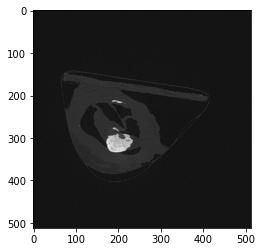

In [17]:
plt.imshow(X[0].permute(1,  2, 0).numpy())

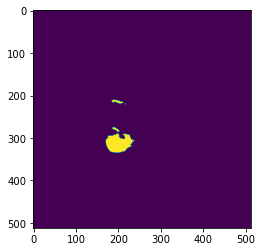

In [18]:
plt.imshow(y[0].numpy())

In [19]:
from torch import nn
class UNET(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()

        self.conv1 = self.contract_block(in_channels, 32, 7, 3)
        self.conv2 = self.contract_block(32, 64, 3, 1)
        self.conv3 = self.contract_block(64, 128, 3, 1)

        self.upconv3 = self.expand_block(128, 64, 3, 1)
        self.upconv2 = self.expand_block(64*2, 32, 3, 1)
        self.upconv1 = self.expand_block(32*2, out_channels, 3, 1)

    def __call__(self, x):

        # downsampling part
        conv1 = self.conv1(x)
        conv2 = self.conv2(conv1)
        conv3 = self.conv3(conv2)

        upconv3 = self.upconv3(conv3)

        upconv2 = self.upconv2(torch.cat([upconv3, conv2], 1))
        upconv1 = self.upconv1(torch.cat([upconv2, conv1], 1))

        return upconv1

    def contract_block(self, in_channels, out_channels, kernel_size, padding):

        contract = nn.Sequential(
            torch.nn.Conv2d(in_channels, out_channels, kernel_size=kernel_size, stride=1, padding=padding),
            torch.nn.BatchNorm2d(out_channels),
            torch.nn.ReLU(),
            torch.nn.Conv2d(out_channels, out_channels, kernel_size=kernel_size, stride=1, padding=padding),
            torch.nn.BatchNorm2d(out_channels),
            torch.nn.ReLU(),
            torch.nn.MaxPool2d(kernel_size=3, stride=2, padding=1)
                                 )

        return contract

    def expand_block(self, in_channels, out_channels, kernel_size, padding):

        expand = nn.Sequential(torch.nn.Conv2d(in_channels, out_channels, kernel_size, stride=1, padding=padding),
                            torch.nn.BatchNorm2d(out_channels),
                            torch.nn.ReLU(),
                            torch.nn.Conv2d(out_channels, out_channels, kernel_size, stride=1, padding=padding),
                            torch.nn.BatchNorm2d(out_channels),
                            torch.nn.ReLU(),
                            torch.nn.ConvTranspose2d(out_channels, out_channels, kernel_size=3, stride=2, padding=1, output_padding=1) 
                            )
        return expand

In [20]:
from torch.nn import functional as F


"""Computes the Sørensen–Dice loss.
Note that PyTorch optimizers minimize a loss. In this
case, we would like to maximize the dice loss so we
return the negated dice loss.
Args:
    true: a tensor of shape [B, 1, H, W].
    logits: a tensor of shape [B, C, H, W]. Corresponds to
        the raw output or logits of the model.
    eps: added to the denominator for numerical stability.
Returns:
    dice_loss: the Sørensen–Dice loss.
"""
        
class DiceLoss(nn.Module):
    def __init__(self, weight=None, size_average=True):
        super(DiceLoss, self).__init__()
    
    def forward(self, logits, true, eps=1e-7):
        num_classes = logits.shape[1]
        if num_classes == 1:
            true_1_hot = torch.eye(num_classes + 1)[true.squeeze(1)]
            true_1_hot = true_1_hot.permute(0, 3, 1, 2).float()
            true_1_hot_f = true_1_hot[:, 0:1, :, :]
            true_1_hot_s = true_1_hot[:, 1:2, :, :]
            true_1_hot = torch.cat([true_1_hot_s, true_1_hot_f], dim=1)
            pos_prob = torch.sigmoid(logits)
            neg_prob = 1 - pos_prob
            probas = torch.cat([pos_prob, neg_prob], dim=1)
        else:
            true_1_hot = torch.eye(num_classes)[true.squeeze(1)]
            true_1_hot = true_1_hot.permute(0, 3, 1, 2).float()
            probas = F.softmax(logits, dim=1)
        true_1_hot = true_1_hot.type(logits.type())
        dims = (0,) + tuple(range(2, true.ndimension()))
        intersection = torch.sum(probas * true_1_hot, dims)
        cardinality = torch.sum(probas + true_1_hot, dims)
        dice_loss = (2. * intersection / (cardinality + eps)).mean()
        return (1 - dice_loss)


def acc_metric(predb, yb):
    return (predb.argmax(dim=1) == yb.to(device)).float().mean()

In [21]:
import time

def train(model, dataloader, loss_fn, optimizer, acc_fn, epochs=1):
    start = time.time()
    model.to(device)

    train_loss = []

    best_acc = 0.0

    for epoch in range(epochs):
        print('Epoch {}/{}'.format(epoch, epochs - 1))
        print('-' * 10)

        model.train(True)  # Set trainind mode = true        
        
        running_loss = 0.0
        running_acc = 0.0

        step = 0

        # iterate over data
        for x, y in dataloader:
            x = x.to(device)
            y = y.to(device)
            step += 1
            
            optimizer.zero_grad()
            outputs = model(x)
            loss = loss_fn(outputs, y)

            # the backward pass frees the graph memory, so there is no 
            # need for torch.no_grad in this training pass
            loss.backward()
            optimizer.step()
            # scheduler.step()


            # stats - whatever is the phase
            acc = acc_fn(outputs, y)

            running_acc  += acc*dataloader.batch_size
            running_loss += loss*dataloader.batch_size 

            if step % 10 == 0:
                # clear_output(wait=True)
                print('Current step: {}  Loss: {}  '.format(step, loss))
                print('Current step: {}  Loss: {}  Acc: {} '.format(step, loss, acc))

                # print(torch.cuda.memory_summary())

        epoch_loss = running_loss / len(dataloader.dataset)
        epoch_acc = running_acc / len(dataloader.dataset)

        print('Loss: {:.4f} Acc: {}'.format(epoch_loss, epoch_acc))
        #print('Loss: {:.4f}'.format(epoch_loss))


        train_loss.append(epoch_loss)
        if epoch % 5 == 0: #Save model weight once every 60k steps permenant file
            print("Saving Model" +str(epoch) + ".torch")
            torch.save(model.state_dict(),   os.path.join(modelPath, str(epoch) + ".torch"))
        

    time_elapsed = time.time() - start
    print('Training complete in {:.0f}m {:.0f}s'.format(time_elapsed // 60, time_elapsed % 60))    
    
    return train_loss   


In [22]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = UNET(in_channels = 3, out_channels = 3).to(device)
modelPath = r'C:\Users\kmorales\Desktop\2DO PhD\Strasbourg\Hugo_seg\model'
#summary(model)

In [25]:
loss_fn  =  DiceLoss()
opt = torch.optim.Adam(model.parameters(), lr = 0.01)
epochs = 101

In [26]:
train_loss = train(model, dataloaders, loss_fn, opt, acc_metric, epochs)

Epoch 0/100
----------
Current step: 10  Loss: 0.7424638271331787  
Current step: 10  Loss: 0.7424638271331787  Acc: 0.9808273315429688 
Current step: 20  Loss: 0.7079346179962158  
Current step: 20  Loss: 0.7079346179962158  Acc: 0.9993896484375 
Current step: 30  Loss: 0.6623491048812866  
Current step: 30  Loss: 0.6623491048812866  Acc: 0.9824714660644531 
Loss: 0.7336 Acc: 0.9529118537902832
Saving Model0.torch
Epoch 1/100
----------
Current step: 10  Loss: 0.6619188785552979  
Current step: 10  Loss: 0.6619188785552979  Acc: 0.9808273315429688 
Current step: 20  Loss: 0.6766743659973145  
Current step: 20  Loss: 0.6766743659973145  Acc: 0.9993896484375 
Current step: 30  Loss: 0.6354705095291138  
Current step: 30  Loss: 0.6354705095291138  Acc: 0.9824714660644531 
Loss: 0.6661 Acc: 1.0032885074615479
Epoch 2/100
----------
Current step: 10  Loss: 0.6274657249450684  
Current step: 10  Loss: 0.6274657249450684  Acc: 0.9808273315429688 
Current step: 20  Loss: 0.6677892208099365  


Current step: 20  Loss: 0.6599881649017334  
Current step: 20  Loss: 0.6599881649017334  Acc: 0.9912147521972656 
Current step: 30  Loss: 0.6024956703186035  
Current step: 30  Loss: 0.6024956703186035  Acc: 0.9908866882324219 
Loss: 0.6293 Acc: 1.0068291425704956
Saving Model20.torch
Epoch 21/100
----------
Current step: 10  Loss: 0.5750010013580322  
Current step: 10  Loss: 0.5750010013580322  Acc: 0.98834228515625 
Current step: 20  Loss: 0.6603150367736816  
Current step: 20  Loss: 0.6603150367736816  Acc: 0.9905567169189453 
Current step: 30  Loss: 0.6023199558258057  
Current step: 30  Loss: 0.6023199558258057  Acc: 0.9908695220947266 
Loss: 0.6290 Acc: 1.006852626800537
Epoch 22/100
----------
Current step: 10  Loss: 0.5742969512939453  
Current step: 10  Loss: 0.5742969512939453  Acc: 0.9884529113769531 
Current step: 20  Loss: 0.6596128940582275  
Current step: 20  Loss: 0.6596128940582275  Acc: 0.991607666015625 
Current step: 30  Loss: 0.6017066240310669  
Current step: 30  

Current step: 30  Loss: 0.5984126329421997  
Current step: 30  Loss: 0.5984126329421997  Acc: 0.9910678863525391 
Loss: 0.6264 Acc: 1.0069140195846558
Saving Model40.torch
Epoch 41/100
----------
Current step: 10  Loss: 0.5697563886642456  
Current step: 10  Loss: 0.5697563886642456  Acc: 0.9879894256591797 
Current step: 20  Loss: 0.6589449644088745  
Current step: 20  Loss: 0.6589449644088745  Acc: 0.9918632507324219 
Current step: 30  Loss: 0.5981968641281128  
Current step: 30  Loss: 0.5981968641281128  Acc: 0.991119384765625 
Loss: 0.6263 Acc: 1.0067601203918457
Epoch 42/100
----------
Current step: 10  Loss: 0.571236252784729  
Current step: 10  Loss: 0.571236252784729  Acc: 0.9873790740966797 
Current step: 20  Loss: 0.6597014665603638  
Current step: 20  Loss: 0.6597014665603638  Acc: 0.9909648895263672 
Current step: 30  Loss: 0.5980237722396851  
Current step: 30  Loss: 0.5980237722396851  Acc: 0.9910793304443359 
Loss: 0.6265 Acc: 1.0066211223602295
Epoch 43/100
----------
C

Loss: 0.6250 Acc: 1.0067697763442993
Saving Model60.torch
Epoch 61/100
----------
Current step: 10  Loss: 0.5657049417495728  
Current step: 10  Loss: 0.5657049417495728  Acc: 0.9880943298339844 
Current step: 20  Loss: 0.6565823554992676  
Current step: 20  Loss: 0.6565823554992676  Acc: 0.9942150115966797 
Current step: 30  Loss: 0.5960680246353149  
Current step: 30  Loss: 0.5960680246353149  Acc: 0.9912452697753906 
Loss: 0.6251 Acc: 1.0069105625152588
Epoch 62/100
----------
Current step: 10  Loss: 0.566491961479187  
Current step: 10  Loss: 0.566491961479187  Acc: 0.9882011413574219 
Current step: 20  Loss: 0.6593954563140869  
Current step: 20  Loss: 0.6593954563140869  Acc: 0.9902858734130859 
Current step: 30  Loss: 0.5960032939910889  
Current step: 30  Loss: 0.5960032939910889  Acc: 0.9907760620117188 
Loss: 0.6251 Acc: 1.0066343545913696
Epoch 63/100
----------
Current step: 10  Loss: 0.5660229921340942  
Current step: 10  Loss: 0.5660229921340942  Acc: 0.9883365631103516 


Current step: 10  Loss: 0.5606856346130371  
Current step: 10  Loss: 0.5606856346130371  Acc: 0.9889450073242188 
Current step: 20  Loss: 0.6591008901596069  
Current step: 20  Loss: 0.6591008901596069  Acc: 0.9897785186767578 
Current step: 30  Loss: 0.5888245105743408  
Current step: 30  Loss: 0.5888245105743408  Acc: 0.9917545318603516 
Loss: 0.6237 Acc: 1.006855845451355
Epoch 82/100
----------
Current step: 10  Loss: 0.5591732263565063  
Current step: 10  Loss: 0.5591732263565063  Acc: 0.9888648986816406 
Current step: 20  Loss: 0.6577852964401245  
Current step: 20  Loss: 0.6577852964401245  Acc: 0.9913673400878906 
Current step: 30  Loss: 0.5879859924316406  
Current step: 30  Loss: 0.5879859924316406  Acc: 0.9918556213378906 
Loss: 0.6227 Acc: 1.0069814920425415
Epoch 83/100
----------
Current step: 10  Loss: 0.5640684366226196  
Current step: 10  Loss: 0.5640684366226196  Acc: 0.9877433776855469 
Current step: 20  Loss: 0.6570641994476318  
Current step: 20  Loss: 0.6570641994

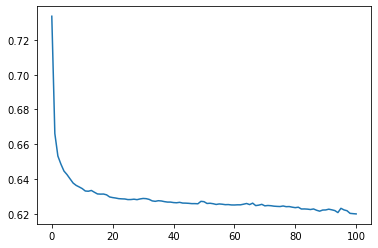

In [27]:
train_loss_ = [train_loss[i].item() for i in range(len(train_loss))]

plt.plot(train_loss_)

In [185]:
train_loss = train(model, dataloaders, loss_fn, opt, acc_metric, epochs)

Epoch 0/200
----------
Current step: 10  Loss: 0.8129570484161377  
Current step: 10  Loss: 0.8129570484161377  Acc: 0.2673788368701935 
Current step: 20  Loss: 0.9037434458732605  
Current step: 20  Loss: 0.9037434458732605  Acc: 0.34211575984954834 
Current step: 30  Loss: 0.8068686723709106  
Current step: 30  Loss: 0.8068686723709106  Acc: 0.4740513265132904 
Loss: 0.8220 Acc: 0.38504359126091003
Saving Model0.torch
Epoch 1/200
----------
Current step: 10  Loss: 0.7929221391677856  
Current step: 10  Loss: 0.7929221391677856  Acc: 0.6101722121238708 
Current step: 20  Loss: 0.8995311856269836  
Current step: 20  Loss: 0.8995311856269836  Acc: 0.4151785671710968 
Current step: 30  Loss: 0.7969440221786499  
Current step: 30  Loss: 0.7969440221786499  Acc: 0.31951531767845154 
Loss: 0.8088 Acc: 0.4690478444099426
Epoch 2/200
----------
Current step: 10  Loss: 0.7753044366836548  
Current step: 10  Loss: 0.7753044366836548  Acc: 0.6031967401504517 
Current step: 20  Loss: 0.8946510553

Current step: 20  Loss: 0.8398476839065552  
Current step: 20  Loss: 0.8398476839065552  Acc: 0.6138791441917419 
Current step: 30  Loss: 0.7324098944664001  
Current step: 30  Loss: 0.7324098944664001  Acc: 0.1266741007566452 
Loss: 0.7048 Acc: 0.530519962310791
Saving Model20.torch
Epoch 21/200
----------
Current step: 10  Loss: 0.5840107202529907  
Current step: 10  Loss: 0.5840107202529907  Acc: 0.8731664419174194 
Current step: 20  Loss: 0.8367207050323486  
Current step: 20  Loss: 0.8367207050323486  Acc: 0.6571269035339355 
Current step: 30  Loss: 0.7266753315925598  
Current step: 30  Loss: 0.7266753315925598  Acc: 0.12587691843509674 
Loss: 0.7013 Acc: 0.5345320701599121
Epoch 22/200
----------
Current step: 10  Loss: 0.5736222267150879  
Current step: 10  Loss: 0.5736222267150879  Acc: 0.882413923740387 
Current step: 20  Loss: 0.8371522426605225  
Current step: 20  Loss: 0.8371522426605225  Acc: 0.6420599222183228 
Current step: 30  Loss: 0.7276208400726318  
Current step: 3

Current step: 30  Loss: 0.6012276411056519  
Current step: 30  Loss: 0.6012276411056519  Acc: 0.5560826063156128 
Loss: 0.6162 Acc: 0.6678081750869751
Saving Model40.torch
Epoch 41/200
----------
Current step: 10  Loss: 0.47001171112060547  
Current step: 10  Loss: 0.47001171112060547  Acc: 0.7801737785339355 
Current step: 20  Loss: 0.8435080051422119  
Current step: 20  Loss: 0.8435080051422119  Acc: 0.5108019709587097 
Current step: 30  Loss: 0.5900102853775024  
Current step: 30  Loss: 0.5900102853775024  Acc: 0.6106903553009033 
Loss: 0.6093 Acc: 0.6758798360824585
Epoch 42/200
----------
Current step: 10  Loss: 0.4689309000968933  
Current step: 10  Loss: 0.4689309000968933  Acc: 0.8136559128761292 
Current step: 20  Loss: 0.8413021564483643  
Current step: 20  Loss: 0.8413021564483643  Acc: 0.5145886540412903 
Current step: 30  Loss: 0.5772081017494202  
Current step: 30  Loss: 0.5772081017494202  Acc: 0.6102120280265808 
Loss: 0.6053 Acc: 0.6733235120773315
Epoch 43/200
-------

Loss: 0.5241 Acc: 0.779226541519165
Saving Model60.torch
Epoch 61/200
----------
Current step: 10  Loss: 0.4327784776687622  
Current step: 10  Loss: 0.4327784776687622  Acc: 0.685945451259613 
Current step: 20  Loss: 0.8109405636787415  
Current step: 20  Loss: 0.8109405636787415  Acc: 0.6397480964660645 
Current step: 30  Loss: 0.4503691792488098  
Current step: 30  Loss: 0.4503691792488098  Acc: 0.5734614133834839 
Loss: 0.5160 Acc: 0.7956016659736633
Epoch 62/200
----------
Current step: 10  Loss: 0.4520305395126343  
Current step: 10  Loss: 0.4520305395126343  Acc: 0.659159779548645 
Current step: 20  Loss: 0.81402587890625  
Current step: 20  Loss: 0.81402587890625  Acc: 0.6234056353569031 
Current step: 30  Loss: 0.4379016160964966  
Current step: 30  Loss: 0.4379016160964966  Acc: 0.6281887888908386 
Loss: 0.5098 Acc: 0.8044410347938538
Epoch 63/200
----------
Current step: 10  Loss: 0.4402686357498169  
Current step: 10  Loss: 0.4402686357498169  Acc: 0.6694036722183228 
Curre

Current step: 10  Loss: 0.38947010040283203  
Current step: 10  Loss: 0.38947010040283203  Acc: 0.833585798740387 
Current step: 20  Loss: 0.801220178604126  
Current step: 20  Loss: 0.801220178604126  Acc: 0.6780133843421936 
Current step: 30  Loss: 0.37339770793914795  
Current step: 30  Loss: 0.37339770793914795  Acc: 0.861726701259613 
Loss: 0.4758 Acc: 0.8565198183059692
Epoch 82/200
----------
Current step: 10  Loss: 0.3838176727294922  
Current step: 10  Loss: 0.3838176727294922  Acc: 0.8562260866165161 
Current step: 20  Loss: 0.8005028367042542  
Current step: 20  Loss: 0.8005028367042542  Acc: 0.6824378371238708 
Current step: 30  Loss: 0.36196190118789673  
Current step: 30  Loss: 0.36196190118789673  Acc: 0.8695790767669678 
Loss: 0.4723 Acc: 0.8631038665771484
Epoch 83/200
----------
Current step: 10  Loss: 0.3849998712539673  
Current step: 10  Loss: 0.3849998712539673  Acc: 0.834941029548645 
Current step: 20  Loss: 0.7969706058502197  
Current step: 20  Loss: 0.79697060

Current step: 20  Loss: 0.7911916971206665  
Current step: 20  Loss: 0.7911916971206665  Acc: 0.7283163070678711 
Current step: 30  Loss: 0.3410646319389343  
Current step: 30  Loss: 0.3410646319389343  Acc: 0.8940927982330322 
Loss: 0.4566 Acc: 0.8886708617210388
Epoch 102/200
----------
Current step: 10  Loss: 0.3704081177711487  
Current step: 10  Loss: 0.3704081177711487  Acc: 0.8886319994926453 
Current step: 20  Loss: 0.7907204627990723  
Current step: 20  Loss: 0.7907204627990723  Acc: 0.7349728941917419 
Current step: 30  Loss: 0.33857017755508423  
Current step: 30  Loss: 0.33857017755508423  Acc: 0.8970822691917419 
Loss: 0.4547 Acc: 0.8934392333030701
Epoch 103/200
----------
Current step: 10  Loss: 0.3697904348373413  
Current step: 10  Loss: 0.3697904348373413  Acc: 0.8872767686843872 
Current step: 20  Loss: 0.7938920259475708  
Current step: 20  Loss: 0.7938920259475708  Acc: 0.7193877696990967 
Current step: 30  Loss: 0.341899037361145  
Current step: 30  Loss: 0.341899

Current step: 30  Loss: 0.3110712766647339  
Current step: 30  Loss: 0.3110712766647339  Acc: 0.9274553656578064 
Loss: 0.4406 Acc: 0.9118115305900574
Epoch 122/200
----------
Current step: 10  Loss: 0.3454452157020569  
Current step: 10  Loss: 0.3454452157020569  Acc: 0.9343112111091614 
Current step: 20  Loss: 0.7855507731437683  
Current step: 20  Loss: 0.7855507731437683  Acc: 0.7625557780265808 
Current step: 30  Loss: 0.31154578924179077  
Current step: 30  Loss: 0.31154578924179077  Acc: 0.9225924611091614 
Loss: 0.4389 Acc: 0.9140278697013855
Epoch 123/200
----------
Current step: 10  Loss: 0.34670257568359375  
Current step: 10  Loss: 0.34670257568359375  Acc: 0.9360650777816772 
Current step: 20  Loss: 0.7842589020729065  
Current step: 20  Loss: 0.7842589020729065  Acc: 0.771085798740387 
Current step: 30  Loss: 0.31510502099990845  
Current step: 30  Loss: 0.31510502099990845  Acc: 0.9271763563156128 
Loss: 0.4398 Acc: 0.915610671043396
Epoch 124/200
----------
Current step

Loss: 0.4425 Acc: 0.9081297516822815
Epoch 142/200
----------
Current step: 10  Loss: 0.34219062328338623  
Current step: 10  Loss: 0.34219062328338623  Acc: 0.940449595451355 
Current step: 20  Loss: 0.8013315200805664  
Current step: 20  Loss: 0.8013315200805664  Acc: 0.6694435477256775 
Current step: 30  Loss: 0.2991214394569397  
Current step: 30  Loss: 0.2991214394569397  Acc: 0.9232302308082581 
Loss: 0.4390 Acc: 0.9110038876533508
Epoch 143/200
----------
Current step: 10  Loss: 0.34511858224868774  
Current step: 10  Loss: 0.34511858224868774  Acc: 0.9412069320678711 
Current step: 20  Loss: 0.7852643728256226  
Current step: 20  Loss: 0.7852643728256226  Acc: 0.7592076063156128 
Current step: 30  Loss: 0.3059319853782654  
Current step: 30  Loss: 0.3059319853782654  Acc: 0.9329161643981934 
Loss: 0.4380 Acc: 0.9139700531959534
Epoch 144/200
----------
Current step: 10  Loss: 0.3468385934829712  
Current step: 10  Loss: 0.3468385934829712  Acc: 0.9356265664100647 
Current step:

Current step: 10  Loss: 0.3437577486038208  
Current step: 10  Loss: 0.3437577486038208  Acc: 0.9153380393981934 
Current step: 20  Loss: 0.7825314998626709  
Current step: 20  Loss: 0.7825314998626709  Acc: 0.7761479616165161 
Current step: 30  Loss: 0.30247366428375244  
Current step: 30  Loss: 0.30247366428375244  Acc: 0.9192841053009033 
Loss: 0.4363 Acc: 0.9163775444030762
Epoch 163/200
----------
Current step: 10  Loss: 0.3381032347679138  
Current step: 10  Loss: 0.3381032347679138  Acc: 0.9363839030265808 
Current step: 20  Loss: 0.784777045249939  
Current step: 20  Loss: 0.784777045249939  Acc: 0.7635124325752258 
Current step: 30  Loss: 0.29207462072372437  
Current step: 30  Loss: 0.29207462072372437  Acc: 0.9204798936843872 
Loss: 0.4363 Acc: 0.9141411781311035
Epoch 164/200
----------
Current step: 10  Loss: 0.33752739429473877  
Current step: 10  Loss: 0.33752739429473877  Acc: 0.9381377696990967 
Current step: 20  Loss: 0.783211350440979  
Current step: 20  Loss: 0.7832

Current step: 20  Loss: 0.7748488783836365  
Current step: 20  Loss: 0.7748488783836365  Acc: 0.8268494606018066 
Current step: 30  Loss: 0.2745932936668396  
Current step: 30  Loss: 0.2745932936668396  Acc: 0.9431202411651611 
Loss: 0.4228 Acc: 0.9363629221916199
Epoch 183/200
----------
Current step: 10  Loss: 0.3266833424568176  
Current step: 10  Loss: 0.3266833424568176  Acc: 0.952128529548645 
Current step: 20  Loss: 0.7743546962738037  
Current step: 20  Loss: 0.7743546962738037  Acc: 0.8288424611091614 
Current step: 30  Loss: 0.27504128217697144  
Current step: 30  Loss: 0.27504128217697144  Acc: 0.9517298936843872 
Loss: 0.4228 Acc: 0.9366819262504578
Epoch 184/200
----------
Current step: 10  Loss: 0.32216376066207886  
Current step: 10  Loss: 0.32216376066207886  Acc: 0.9508529901504517 
Current step: 20  Loss: 0.7730526328086853  
Current step: 20  Loss: 0.7730526328086853  Acc: 0.838289201259613 
Current step: 30  Loss: 0.2765389680862427  
Current step: 30  Loss: 0.27653

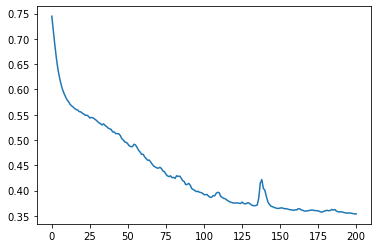

In [122]:
train_loss_ = [train_loss[i].item() for i in range(len(train_loss))]

plt.plot(train_loss_)

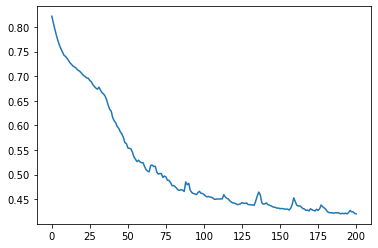

In [187]:
train_loss_ = [train_loss[i].item() for i in range(len(train_loss))]

plt.plot(train_loss_)

In [28]:
path_test_masks = os.path.join(path, 'test', 'mask')
path_test = os.path.join(path, 'test')

names_ = [f[:-25] for f in os.listdir(path_test_masks) if f.endswith('png') and 'sheet' in f]
print(len(names_))
names_.sort()


mask_nod = [ f  for f in os.listdir(path_test_masks) if f.endswith('png') and 'nodular' in f and  f[:-27] in names_ ]
names  = [f[:-27] for f in mask_nod ]

mask_nod = [ os.path.join(path_test_masks, f)  for f in os.listdir(path_test_masks) if f.endswith('png') and 'nodular' in f and  f[:-27] in names_ ]
mask_sh = [os.path.join(path_test_masks, f) for f in os.listdir(path_test_masks) if f.endswith('png') and 'sheet' in f  and  f[:-25] in names ]
#mask_bck = [os.path.join(path_test_masks, f) for f in os.listdir(path_test_masks) if f.endswith('png') and 'ale._nonbck' in f  and f[:-22] in names]
#mask_bck = [os.path.join(path_test_masks, f) for f in os.listdir(path_test_masks) if f.endswith('png') and 'nonbck' in f  and f[:-22] in names]

image_Paths  = [os.path.join(path_test_masks, f) for f in os.listdir(path_test_masks) if (f.endswith('grayscale.png') or f.endswith('greyscale.png') )  and f[:-14] in names]
print(len(mask_nod), len(mask_sh), len(image_Paths))
#print(len(mask_nod), len(mask_sh), len(mask_bck), len(image_Paths))
mask_nod.sort()
mask_sh.sort()
#mask_bck.sort()
image_Paths.sort()

#mask_Paths  = [[nod, sh, bck]  for nod, sh, bck in zip(mask_nod,mask_sh,mask_bck) ]
mask_Paths_test  = [[nod, sh]  for nod, sh in zip(mask_nod,mask_sh) ]

10
9 9 9


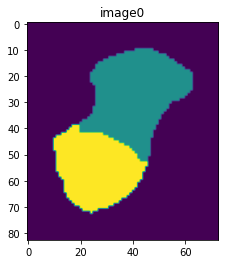

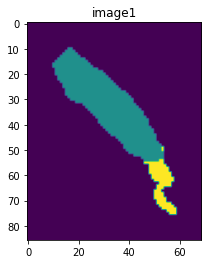

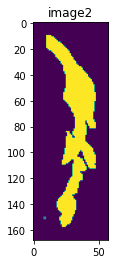

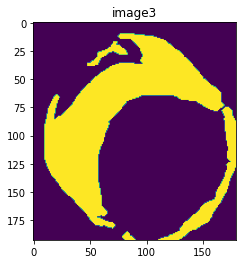

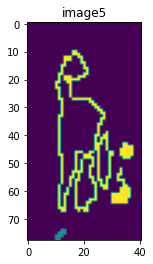

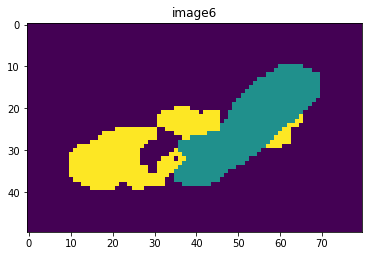

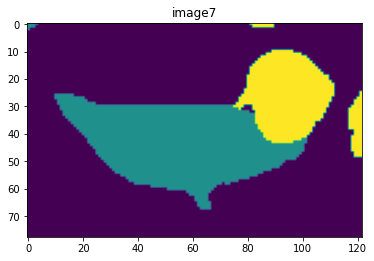

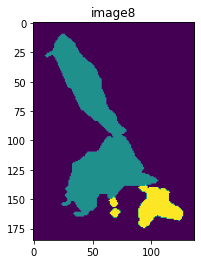

In [29]:
error = 10
idxs = []
for idx in range(len(mask_Paths_test)):
    mask =  create_binary_mask(mask_Paths_test, idx)
    x,w, y , h = box_image_seg(mask)
    #print('\n Img: ', idx, x,w, y , h)
    if (h,w) != mask.shape:
        idxs.append(idx)
        #print(mask[y-error:h+error,x-error:w+error].shape)
        plt.imshow(mask[y-error:h+error,x-error:w+error])
        plt.title('image' + str(idx))
        plt.show()
        


In [30]:
model.load_state_dict(torch.load(os.path.join(modelPath , '100.torch'))) # Load trained model
model.eval()

UNET(
  (conv1): Sequential(
    (0): Conv2d(3, 32, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3))
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): Conv2d(32, 32, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3))
    (4): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU()
    (6): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  )
  (conv2): Sequential(
    (0): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU()
    (6): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  )
  (conv3): Sequential(
    (0): Conv2d(64, 128, kerne

In [31]:
print(len(image_Paths), len(mask_Paths_test))

9 9


tensor(0.6439, grad_fn=<RsubBackward1>)


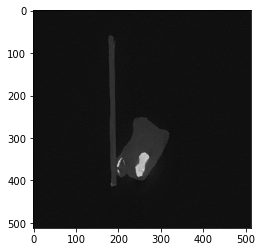

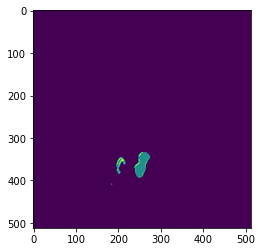

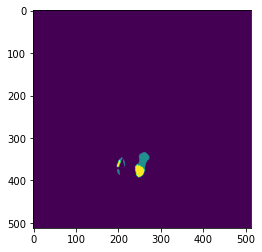

tensor(0.6367, grad_fn=<RsubBackward1>)


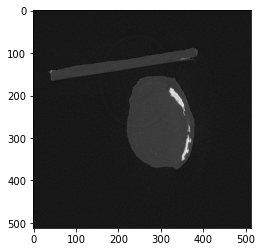

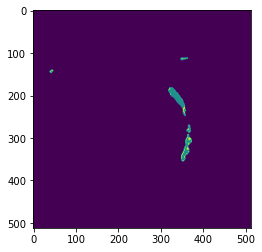

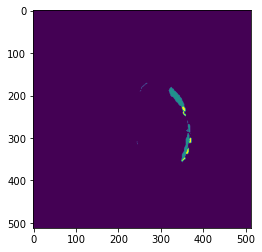

tensor(0.6558, grad_fn=<RsubBackward1>)


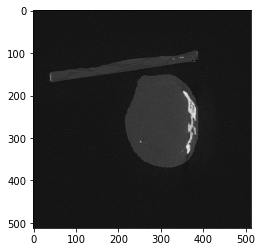

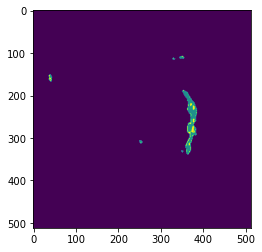

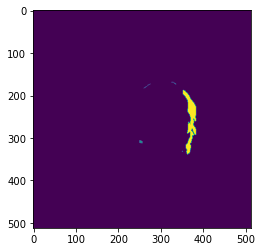

tensor(0.5642, grad_fn=<RsubBackward1>)


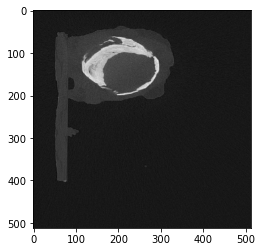

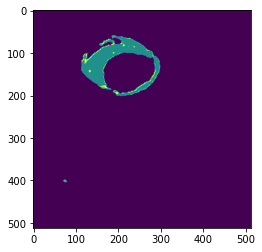

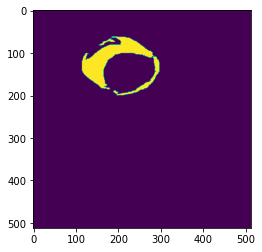

tensor(0.6770, grad_fn=<RsubBackward1>)


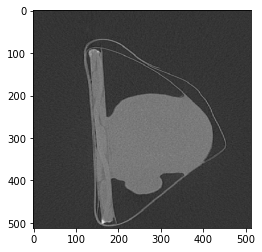

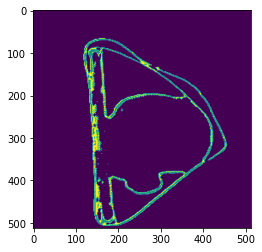

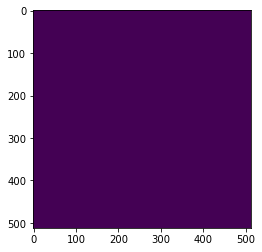

tensor(0.6332, grad_fn=<RsubBackward1>)


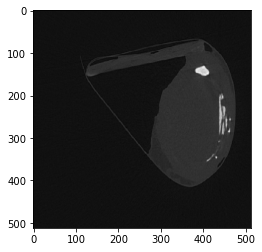

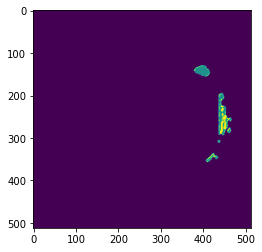

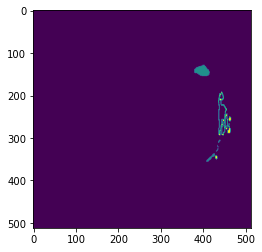

tensor(0.6328, grad_fn=<RsubBackward1>)


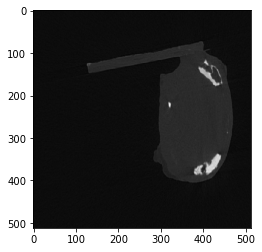

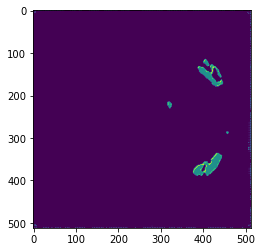

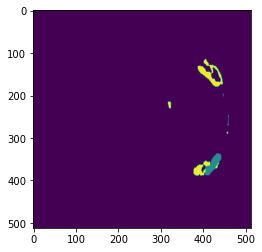

tensor(0.5728, grad_fn=<RsubBackward1>)


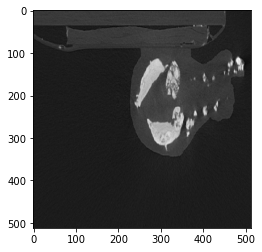

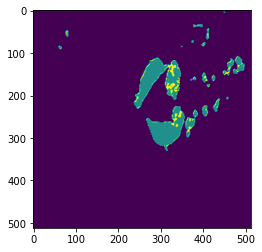

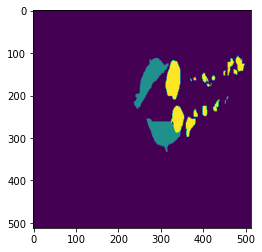

tensor(0.6225, grad_fn=<RsubBackward1>)


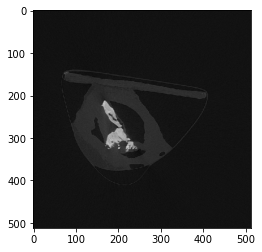

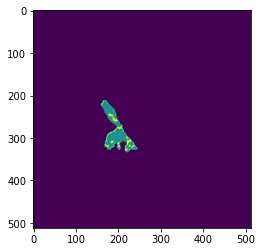

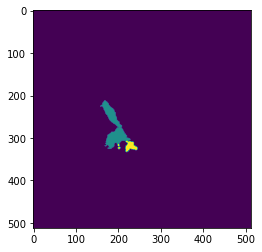

In [32]:
data_test = SegmentationDataset(image_Paths, mask_Paths_test)
dataloaders_test = torch.utils.data.DataLoader(data_test, 1)

for index, batch in enumerate(dataloaders_test): 
    X, y = batch

    X, y = X.to(device), y.to(device)
    pred =  model(X)
    seg = torch.argmax(pred, dim=1).numpy()[0]# torch.argmax(pred, 1).numpy()  # Get  prediction classes
    print(loss_fn(pred, y))
    plt.imshow(X.squeeze().permute(1,2,0))
    plt.show()
    plt.imshow(seg)
    plt.show()
    plt.imshow(y.squeeze())
    plt.show()

In [ ]:
#import copy
model = UNET(in_channels = 3, out_channels = 4).to(device)

modelPath =  r'C:\Users\kmorales\Desktop\2DO PhD\Strasbourg\modelo_1\best_unet_model.pth'
model.load_state_dict(torch.load(modelPath)) # Load trained model
model.eval()


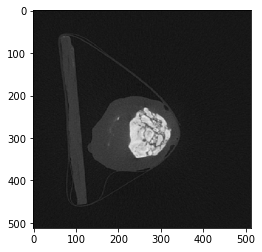

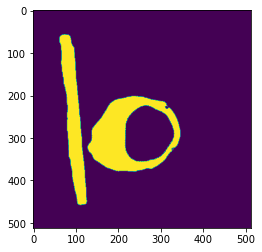

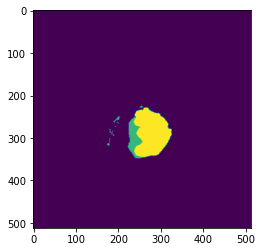

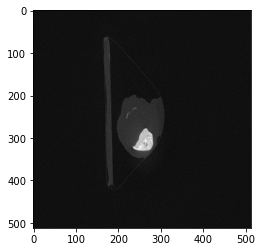

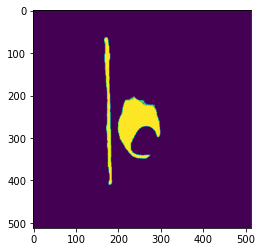

...

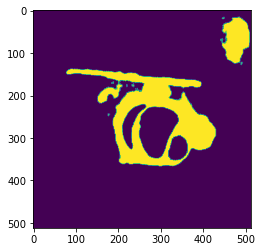

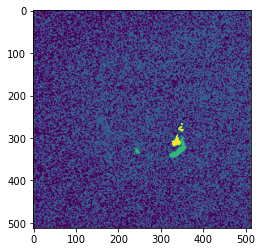

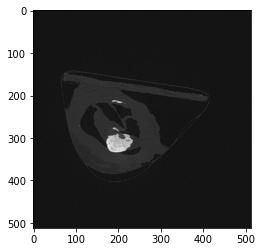

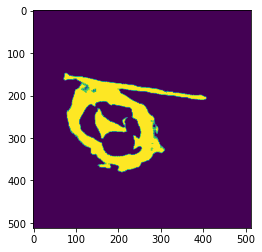

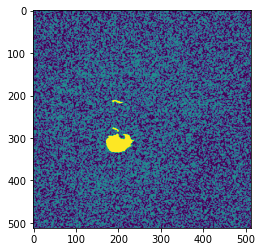

In [552]:
for index, batch in enumerate(dataloaders_test): 

    X, y = batch

    X, y = X.to(device), y.to(device)
    pred =  model(X)
    seg = torch.argmax(pred, dim=1).numpy()[0]# torch.argmax(pred, 1).numpy()  # Get  prediction classes
    plt.imshow(X.squeeze().permute(1,2,0))
    plt.show()
    plt.imshow(seg)
    plt.show()
    plt.imshow(y.squeeze())
    plt.show()